Después del estudio del dataset con los datos anuales, vamos a intentar mejorar las predicciones aumentando el número de muestras para cada empresa. Para esto usaremos un dataset con datos fundamentales con periodicidad trimestral, que juntaremos con datos mensuales de prices, usando interpolación para rellenar las filas en las que no disponemos de datos

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import quandl
from pandas.plotting import lag_plot
from math import sqrt
from sklearn.metrics import mean_squared_error

In [2]:
#Transformación para series temporales donde cogemos el año como índice del dataframe
financialDF = pd.read_csv('Datos/financials_prices_quaterly_guru_rango_fechas_v2.csv', sep=',', index_col=[0,1], header=0)
financialDF.head()

BS__ACCOUNTS_PAYABLE  \
Ticker FISCAL_YEAR                         
SVMK   2016-12                     1.618   
       2017-06                     0.000   
       2017-12                     3.380   
       2018-06                     3.235   
SVNLF  2005-12                       NaN   

                    BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE  \
Ticker FISCAL_YEAR                                          
SVMK   2016-12                                  27.813000   
       2017-06                                   0.000000   
       2017-12                                  13.553000   
       2018-06                                  16.778000   
SVNLF  2005-12                                  96.456148   

                    BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE_FOR_FINANCIAL_COMPANIES  \
Ticker FISCAL_YEAR                                                                  
SVMK   2016-12                                                    NaN               
       2017-06                                                    NaN               
       2017-12                                                    NaN               
       2018-06                                                    NaN               
SVNLF  2005-12                                                    NaN               

                    BS__ACCOUNTS_RECEIVABLE  BS__ACCUMULATED_DEPRECIATION  \
Ticker FISCAL_YEAR                                                          
SVMK   2016-12                        6.104                       -12.672   
       2017-06                        0.000                         0.000   
       2017-12                        5.429                       -27.251   
       2018-06                        6.243                       -34.244   
SVNLF  2005-12                        0.000                           NaN   

                    BS__ACCUMULATED_OTHER_COMPREHENSIVE_INCOME_LOSS  \
Ticker FISCAL_YEAR                                                    
SVMK   2016-12                                                0.087   
       2017-06                                                0.000   
       2017-12                                                0.019   
       2018-06                                               -0.243   
SVNLF  2005-12                                                0.000   

                    BS__ADDITIONAL_PAID_IN_CAPITAL  \
Ticker FISCAL_YEAR                                   
SVMK   2016-12                             185.490   
       2017-06                               0.000   
       2017-12                             216.581   
       2018-06                             231.586   
SVNLF  2005-12                               0.000   

                    BS__ALLOWANCE_FOR_LOANS_AND_LEASE_LOSSES  \
Ticker FISCAL_YEAR                                             
SVMK   2016-12                                           NaN   
       2017-06                                           NaN   
       2017-12                                           NaN   
       2018-06                                           NaN   
SVNLF  2005-12                                           0.0   

                    BS__BUILDINGS_AND_IMPROVEMENTS  \
Ticker FISCAL_YEAR                                   
SVMK   2016-12                               71.78   
       2017-06                                0.00   
       2017-12                               71.78   
       2018-06                               71.78   
SVNLF  2005-12                                 NaN   

                    BS__CAPITAL_LEASE_OBLIGATION          ...            \
Ticker FISCAL_YEAR                                        ...             
SVMK   2016-12                            81.939          ...             
       2017-06                             0.000          ...             
       2017-12                            93.385          ...             
       2018-06                            92.682          ...      

In [3]:
financialDF.shape

(385772, 324)

Me voy a quedar con tres compañías para intentar predecir su valor. Para ello elijo aquellas de las que dispongo más datos, cogeré una tecnológica (Apple), una del sector salud (Abbott Laboratories) y otra del sector energético (Devon Energy Corp.). Todas ellas pertenencen al índice SP500

In [4]:
lista_companyas = ['AAPL', 'ABT', 'DVN']
financialDF.reset_index(level=financialDF.index.names, inplace=True)
financialDF = financialDF[financialDF['Ticker'].isin(lista_companyas)]
financialDF.head()

,Ticker,FISCAL_YEAR,BS__ACCOUNTS_PAYABLE,BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE,BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE_FOR_FINANCIAL_COMPANIES,BS__ACCOUNTS_RECEIVABLE,BS__ACCUMULATED_DEPRECIATION,BS__ACCUMULATED_OTHER_COMPREHENSIVE_INCOME_LOSS,BS__ADDITIONAL_PAID_IN_CAPITAL,BS__ALLOWANCE_FOR_LOANS_AND_LEASE_LOSSES,...,RETURNS,PRICE_INI,PRICE_FIN,INDEX_RETURNS,RETURNS_NEXT,INDEX_RETURNS_NEXT,RETURNS_CAT,RETURNS_NEXT_CAT,RETURNS_vs_INDEX,RETURNS_vs_INDEX_NEXT
56106,AAPL,1990-03,235.8,235.8,NaN,0.0,-377.5,0.0,0.0,NaN,...,0.142857,1.26,1.44,-0.038087,0.111111,0.053186,POSITIVE,POSITIVE,WINS,WINS
56107,AAPL,1990-06,279.1,279.1,NaN,0.0,-414.7,0.0,0.0,NaN,...,0.111111,1.44,1.60,0.053186,-0.337580,-0.145159,POSITIVE,NEGATIVE,WINS,LOSES
56108,AAPL,1990-09,340.6,340.6,NaN,0.0,-446.7,0.0,0.0,NaN,...,-0.337580,1.57,1.04,-0.145159,0.412844,0.078798,NEGATIVE,POSITIVE,LOSES,WINS
56109,AAPL,1990-12,417.3,417.3,NaN,0.0,-480.7,0.0,0.0,NaN,...,0.412844,1.09,1.54,0.078798,0.577922,0.136342,POSITIVE,POSITIVE,WINS,WINS
56110,AAPL,1991-03,421.0,421.0,NaN,0.0,-513.9,0.0,0.0,NaN,...,0.577922,1.54,2.43,0.136342,-0.395918,-0.010820,POSITIVE,NEGATIVE,WINS,LOSES


In [5]:
financialDF['Year'] = financialDF['FISCAL_YEAR'].str.split('-').str[0]
financialDF['Month'] = financialDF['FISCAL_YEAR'].str.split('-').str[1]
financialDF.head()

,Ticker,FISCAL_YEAR,BS__ACCOUNTS_PAYABLE,BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE,BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE_FOR_FINANCIAL_COMPANIES,BS__ACCOUNTS_RECEIVABLE,BS__ACCUMULATED_DEPRECIATION,BS__ACCUMULATED_OTHER_COMPREHENSIVE_INCOME_LOSS,BS__ADDITIONAL_PAID_IN_CAPITAL,BS__ALLOWANCE_FOR_LOANS_AND_LEASE_LOSSES,...,PRICE_FIN,INDEX_RETURNS,RETURNS_NEXT,INDEX_RETURNS_NEXT,RETURNS_CAT,RETURNS_NEXT_CAT,RETURNS_vs_INDEX,RETURNS_vs_INDEX_NEXT,Year,Month
56106,AAPL,1990-03,235.8,235.8,NaN,0.0,-377.5,0.0,0.0,NaN,...,1.44,-0.038087,0.111111,0.053186,POSITIVE,POSITIVE,WINS,WINS,1990,03
56107,AAPL,1990-06,279.1,279.1,NaN,0.0,-414.7,0.0,0.0,NaN,...,1.60,0.053186,-0.337580,-0.145159,POSITIVE,NEGATIVE,WINS,LOSES,1990,06
56108,AAPL,1990-09,340.6,340.6,NaN,0.0,-446.7,0.0,0.0,NaN,...,1.04,-0.145159,0.412844,0.078798,NEGATIVE,POSITIVE,LOSES,WINS,1990,09
56109,AAPL,1990-12,417.3,417.3,NaN,0.0,-480.7,0.0,0.0,NaN,...,1.54,0.078798,0.577922,0.136342,POSITIVE,POSITIVE,WINS,WINS,1990,12
56110,AAPL,1991-03,421.0,421.0,NaN,0.0,-513.9,0.0,0.0,NaN,...,2.43,0.136342,-0.395918,-0.010820,POSITIVE,NEGATIVE,WINS,LOSES,1991,03


In [6]:
financialDF.shape

(342, 328)

### Limpieza y preprocesado de los datos

Voy a quedarme con las columnas que me interesan. Primero borramos las columnas con mas de un 10% de NaNs

In [7]:
num_valores = round(financialDF.shape[0]*0.90)
financialDF.dropna(thresh=num_valores, axis=1, inplace=True)
financialDF.shape

(342, 224)

Quitamos también las columnas FISCAL_YEAR, PRICE_INI, PRICE_FIN, RETURNS_NEXT, INDEX_RETURNS_NEXT, RETURNS_CAT, RETURNS_NEXT_CAT, RETURNS_vs_INDEX, RETURNS_vs_INDEX_NEXT, REGION, PRELIMINARY.

In [8]:
columns_to_drop = ['FISCAL_YEAR', 'PRICE_INI', 'PRICE_FIN', 'RETURNS_NEXT', 'INDEX_RETURNS_NEXT', 'RETURNS_CAT', 
                   'RETURNS_NEXT_CAT', 'RETURNS_vs_INDEX', 'RETURNS_vs_INDEX_NEXT', 'REGION', 'PRELIMINARY']
financialDF.drop(columns_to_drop, axis=1, inplace=True)
financialDF.shape

(342, 213)

Columnas correladas (Ver Notebook Analisis exploratorio)

In [9]:
columns_to_drop = ['BS__DEBT_TO_EQUITY','BS__EQUITY_TO_ASSET','IS__NET_MARGIN','IS__OPERATING_MARGIN',
                   'CS__DEPRECIATION_DEPLETION_AND_AMORTIZATION','VQ__MONTH_END_STOCK_PRICE',
                   'VQ__ENTERPRISE_VALUE','VQ__QUICK_RATIO','CS__CASH_FLOW_FROM_OPERATIONS',
                   'VR__PRICE_TO_FREE_CASH_FLOW','CS__PURCHASE_OF_PROPERTY_PLANT_EQUIPMENT',
                   'CS__CASH_FLOW_FROM_OPERATIONS','CS__CHANGE_IN_WORKING_CAPITAL','CS__CASH_FLOW_FROM_FINANCING',
                   'CS__NET_ISSUANCE_OF_DEBT','CS__FREE_CASH_FLOW','CS__CHANGE_IN_WORKING_CAPITAL',
                   'CS__CASH_FLOW_FROM_OPERATIONS','CS__CASH_FLOW_FROM_FINANCING','CS__FREE_CASH_FLOW',
                   'PSDA__EBIT_PER_SHARE','IS__INTEREST_EXPENSE','CS__CASH_FLOW_FROM_OPERATIONS',
                   'VR__PRICE_TO_OPERATING_CASH_FLOW','VR__PRICE_TO_FREE_CASH_FLOW','VR__PRICE_TO_TANGIBLE_BOOK',
                   'BS__PREFERRED_STOCK','IS__PRE_TAX_INCOME','BS__EQUITY_TO_ASSET','CSR__DEBT_TO_ASSET',
                   'CS__CASH_FLOW_FROM_FINANCING','CS__CASH_FLOW_FROM_FINANCING','CS__CASH_FLOW_FROM_FINANCING',
                   'CS__NET_ISSUANCE_OF_DEBT','CS__CASH_FLOW_FROM_FINANCING','CS__PURCHASE_OF_INVESTMENT',
                   'CS__CASH_FLOW_FROM_FINANCING','IS__INTEREST_INCOME','CS__CASH_FLOW_FROM_OPERATIONS',
                   'CS__FREE_CASH_FLOW','CS__CASH_FLOW_FROM_OPERATIONS','CS__NET_ISSUANCE_OF_DEBT',
                   'IS__INTEREST_EXPENSE']
financialDF.drop(columns_to_drop, axis=1, inplace=True)
financialDF.shape       

(342, 189)

In [10]:
financialDF.describe()

,BS__ACCOUNTS_PAYABLE,BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE,BS__ACCOUNTS_RECEIVABLE,BS__ACCUMULATED_DEPRECIATION,BS__ACCUMULATED_OTHER_COMPREHENSIVE_INCOME_LOSS,BS__ADDITIONAL_PAID_IN_CAPITAL,BS__BUILDINGS_AND_IMPROVEMENTS,BS__CAPITAL_LEASE_OBLIGATION,BS__CASH_AND_CASH_EQUIVALENTS,BS__CASH_CASH_EQUIVALENTS_MARKETABLE_SECURITIES,...,VR__EV_TO_REVENUE,VR__FORWARD_RATE_OF_RETURN_YACKTMAN,VR__PB_RATIO,VR__PEG_RATIO,VR__PE_RATIO,VR__PRICE_TO_OWNER_EARNINGS,VR__PS_RATIO,VR__SHILLER_PE_RATIO,RETURNS,INDEX_RETURNS
count,342.000000,342.000000,342.000000,342.000000,342.000000,342.000000,342.000000,342.000000,342.000000,342.000000,...,342.000000,342.000000,342.000000,342.000000,342.000000,342.000000,342.000000,342.000000,342.000000,342.000000
mean,3516.690020,5973.287143,2630.112360,-11059.553038,-159.254889,3669.782099,247.143351,3.652047,3438.201553,7253.088187,...,2.579883,8.335760,2.887778,1.382018,19.690205,23.044620,2.308392,58.788772,0.043642,0.020774
std,8251.194433,12650.585077,3563.813412,17029.494964,1616.863621,5186.860651,762.976719,67.538185,5410.073852,14158.324525,...,1.412953,11.700309,1.496098,7.351676,34.935043,114.675174,1.188559,351.187605,0.190020,0.075180
min,6.300000,6.300000,0.000000,-77292.000000,-7263.000000,0.000000,0.000000,0.000000,3.800000,3.800000,...,0.160000,-21.500000,0.990000,0.000000,0.000000,0.000000,0.230000,0.000000,-0.517060,-0.224125
25%,638.127250,711.611000,585.250000,-9474.578750,-87.000000,0.000000,0.000000,0.000000,355.571500,396.859750,...,1.572500,0.000000,1.772500,0.000000,7.970000,4.732500,1.402500,0.000000,-0.067587,-0.010820
50%,1049.500000,1707.500000,1407.000000,-4799.759000,0.000000,0.000000,0.000000,0.000000,1335.000000,1757.175500,...,2.595000,6.310000,2.465000,0.000000,11.585000,11.210000,2.195000,13.425000,0.039870,0.025377
75%,1524.250000,5416.084750,3304.603500,-735.250000,387.750000,6812.750000,0.000000,0.000000,3778.439500,6487.750000,...,3.485000,17.847500,3.465000,0.630000,19.005000,18.295000,3.127500,31.520000,0.134464,0.060451
max,62985.000000,89266.000000,23440.000000,0.000000,2710.000000,23317.000000,4467.387000,1249.000000,45059.000000,87940.000000,...,6.910000,70.850000,10.360000,121.880000,383.330000,2010.000000,6.540000,5998.250000,1.085106,0.208670


Y también las que vienen con todos los valores a cero

In [11]:
columns_to_drop = []
cols = financialDF.columns.drop(['Ticker', 'Year', 'Month'])
for c in cols:    
    if financialDF[c].sum() == 0:         
        columns_to_drop.append(c)
financialDF.drop(columns_to_drop, axis=1, inplace=True)
financialDF.shape 

(342, 184)

Voy a ir viendo una a una las variables para cada una de las empresas

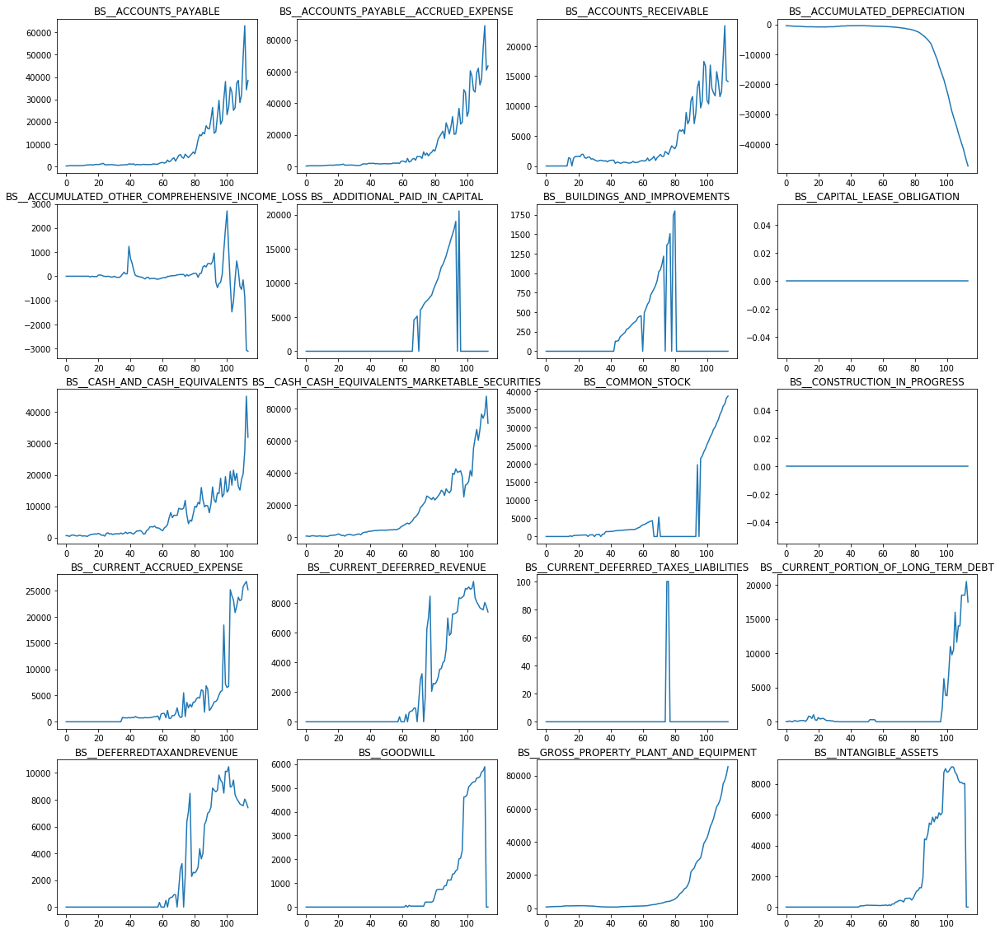

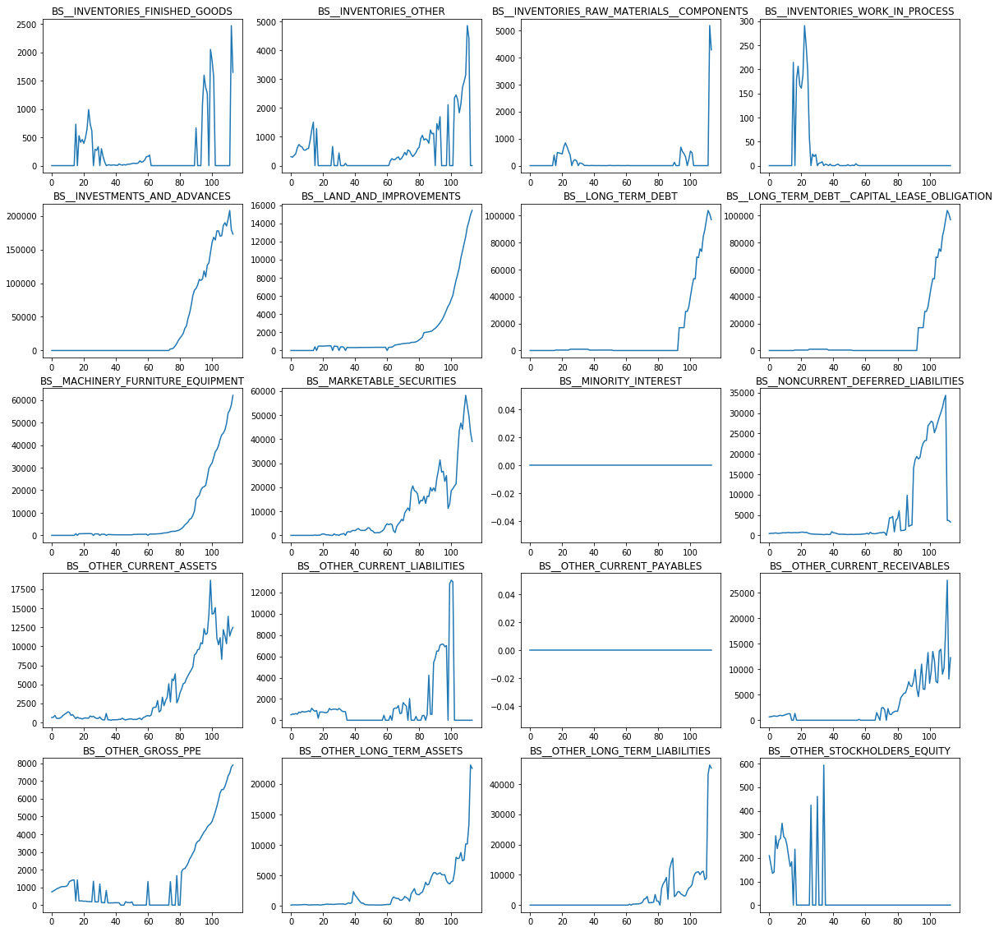

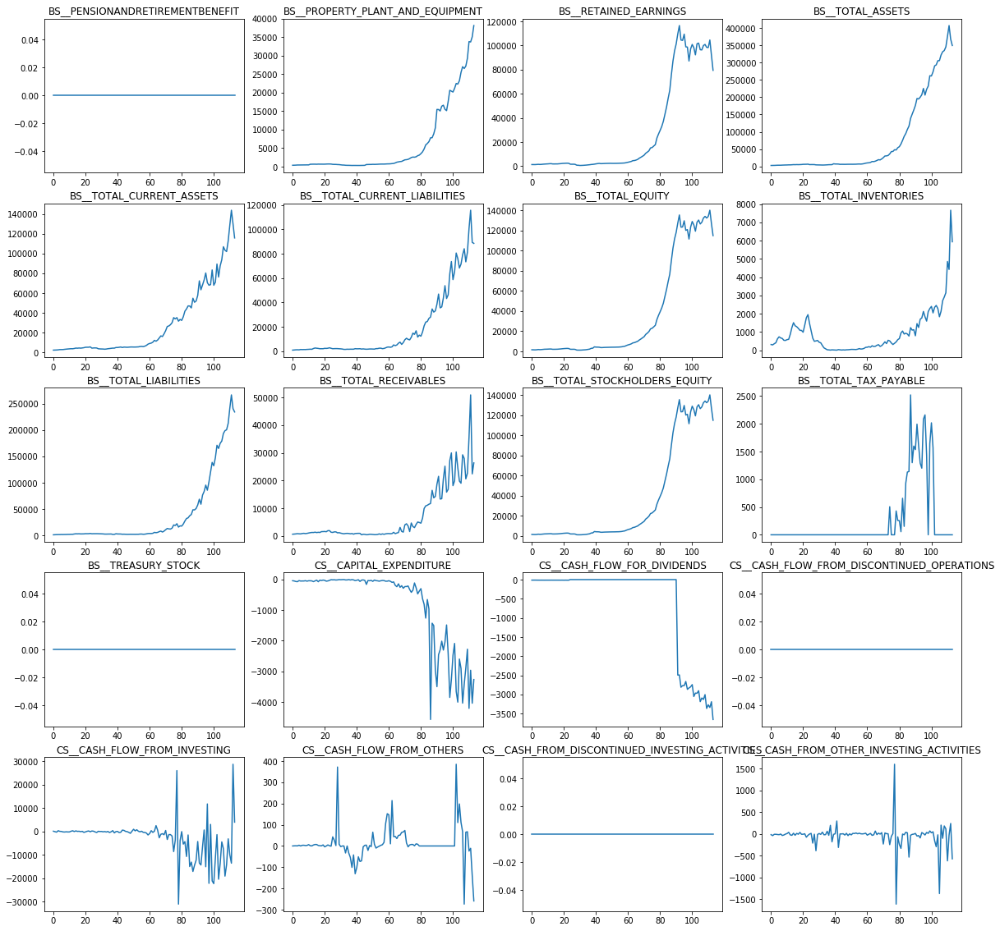

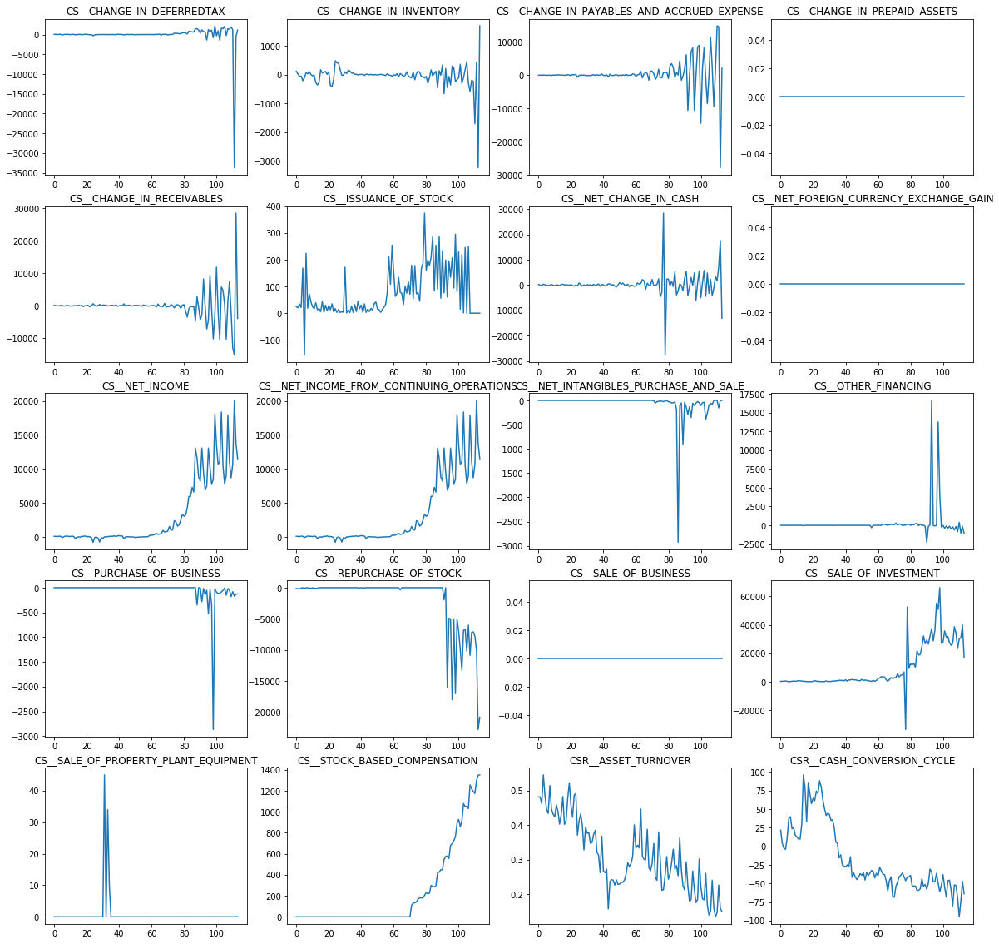

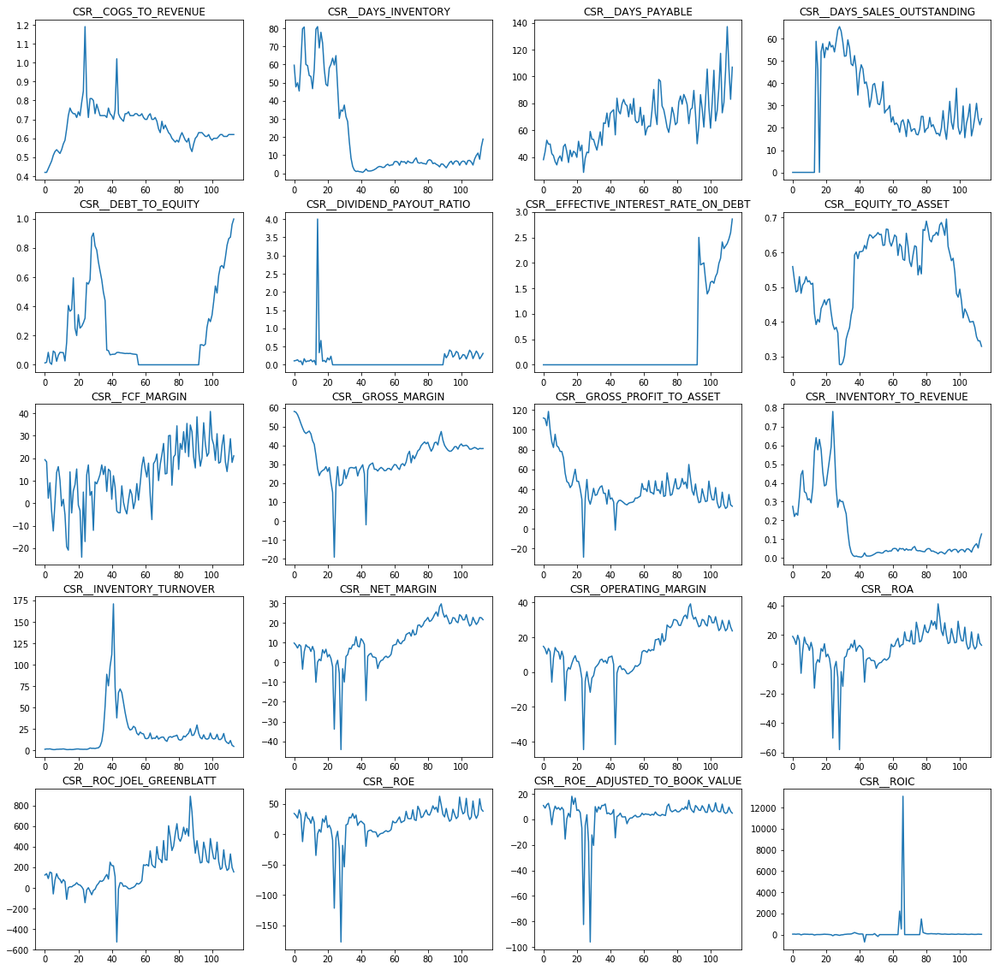

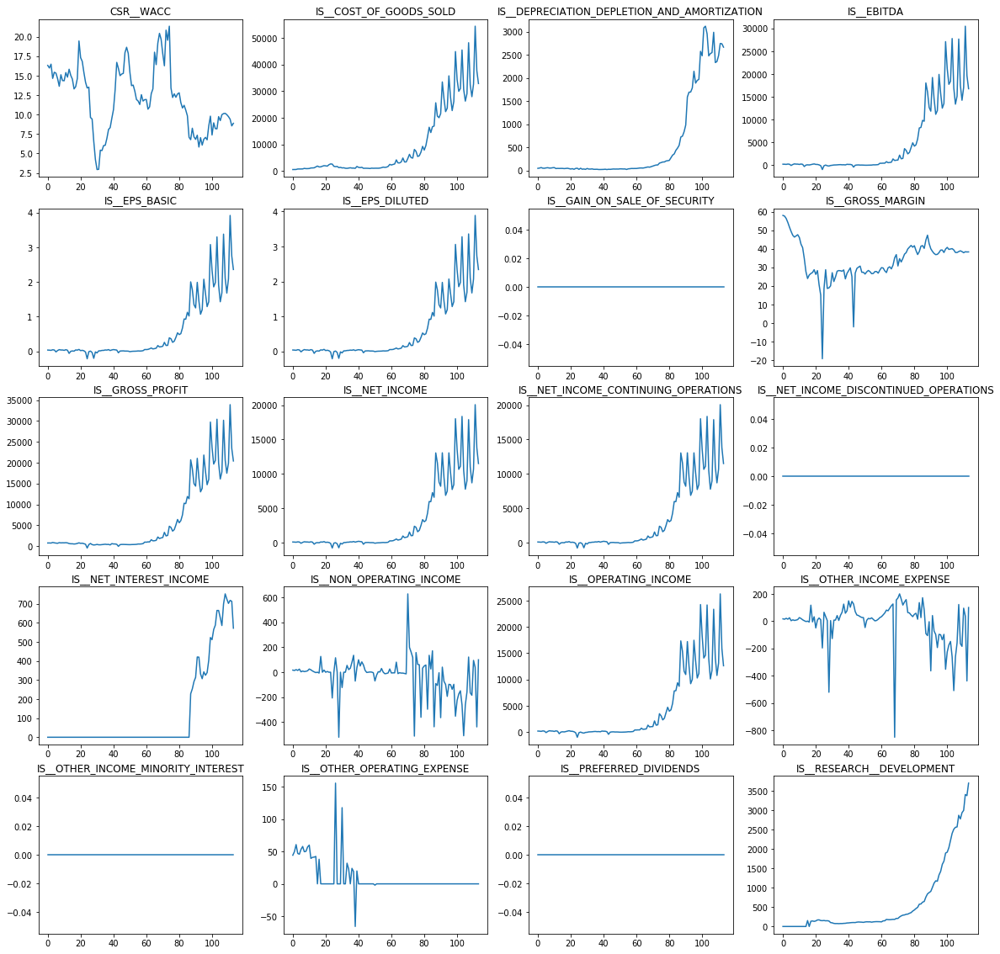

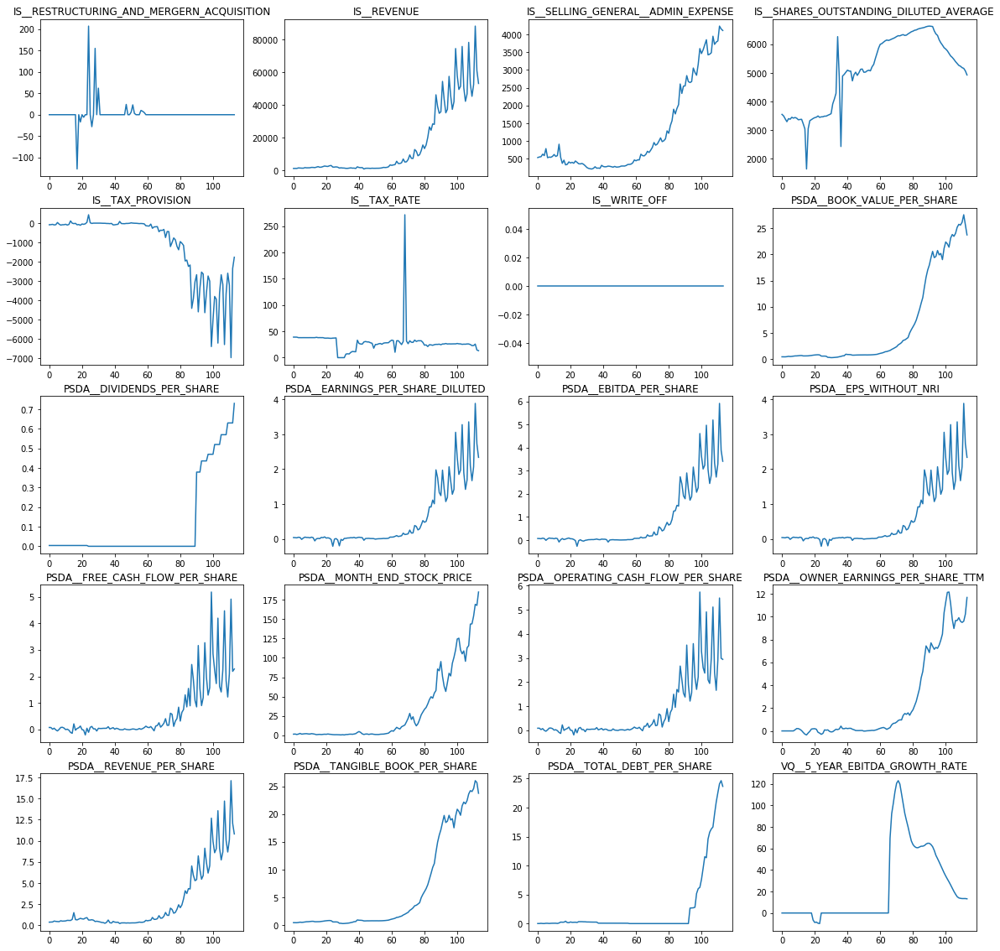

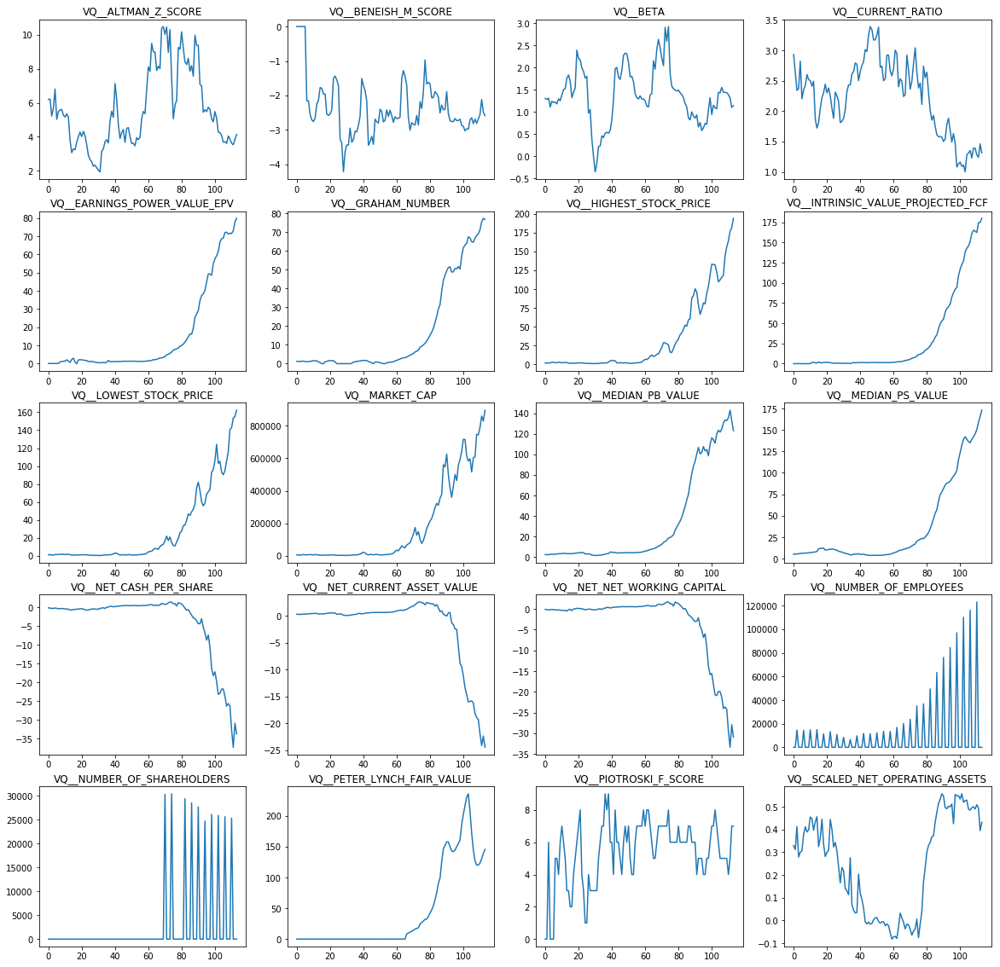

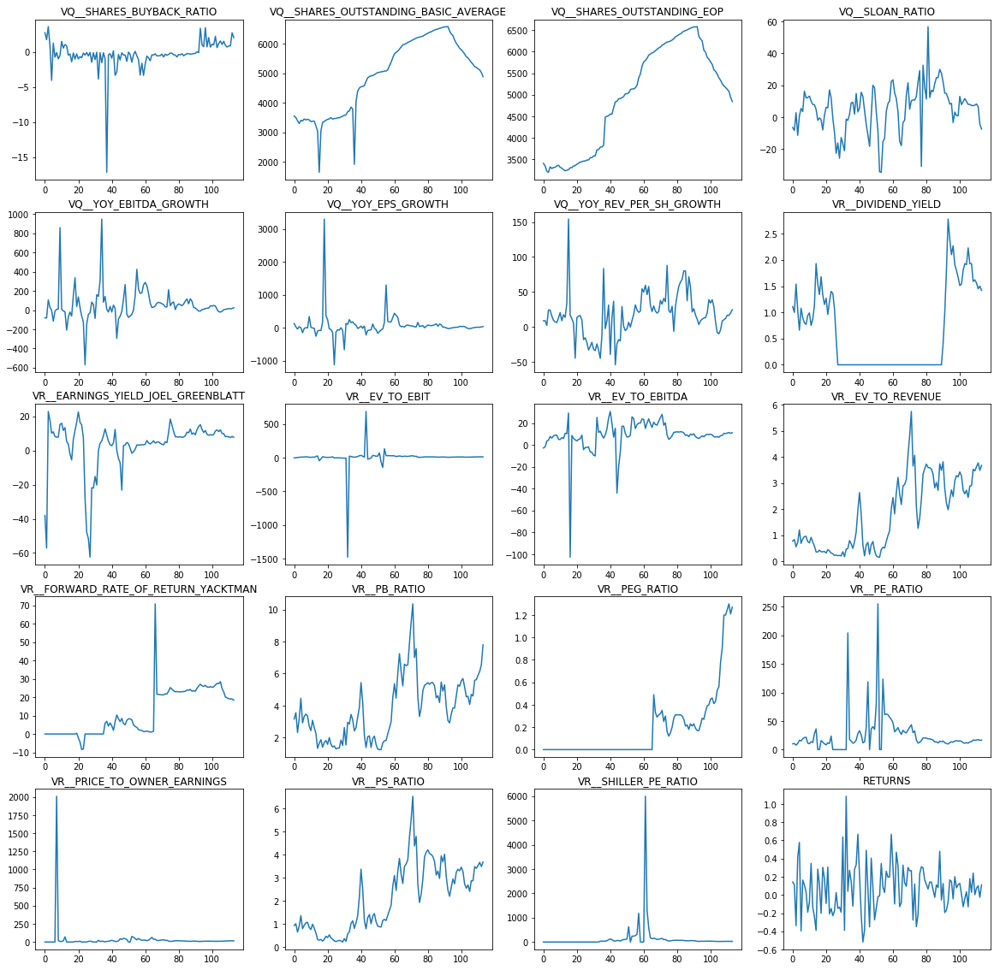

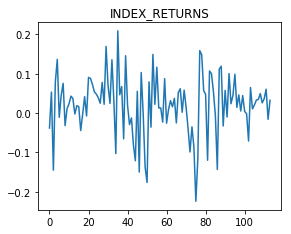

In [12]:
#APPLE
plt.clf()
i = 1
plt.figure(figsize=(20,20))
df = financialDF[financialDF['Ticker'] == 'AAPL']
cols = df.columns.drop(['Ticker','Year','Month'])
for col in cols:    
    plt.subplot(5, 4, i)
    plt.plot(df[col].values)
    plt.title(col)    
    if i == 20:
        i=0
        plt.show()
        plt.figure(figsize=(20,20))
    i += 1

Vuelven a salir columnas con cero valores, las voy a quitar

In [13]:
columns_to_drop = []
dfApple = financialDF[financialDF['Ticker'] == 'AAPL']
cols = financialDF.columns.drop(['Ticker','Year', 'Month'])
for c in cols:    
    if dfApple[c].sum() == 0:         
        columns_to_drop.append(c)
dfApple.drop(columns_to_drop, axis=1, inplace=True)
dfApple.drop(['Ticker'], axis=1, inplace=True)
dfApple.shape 

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


(114, 167)

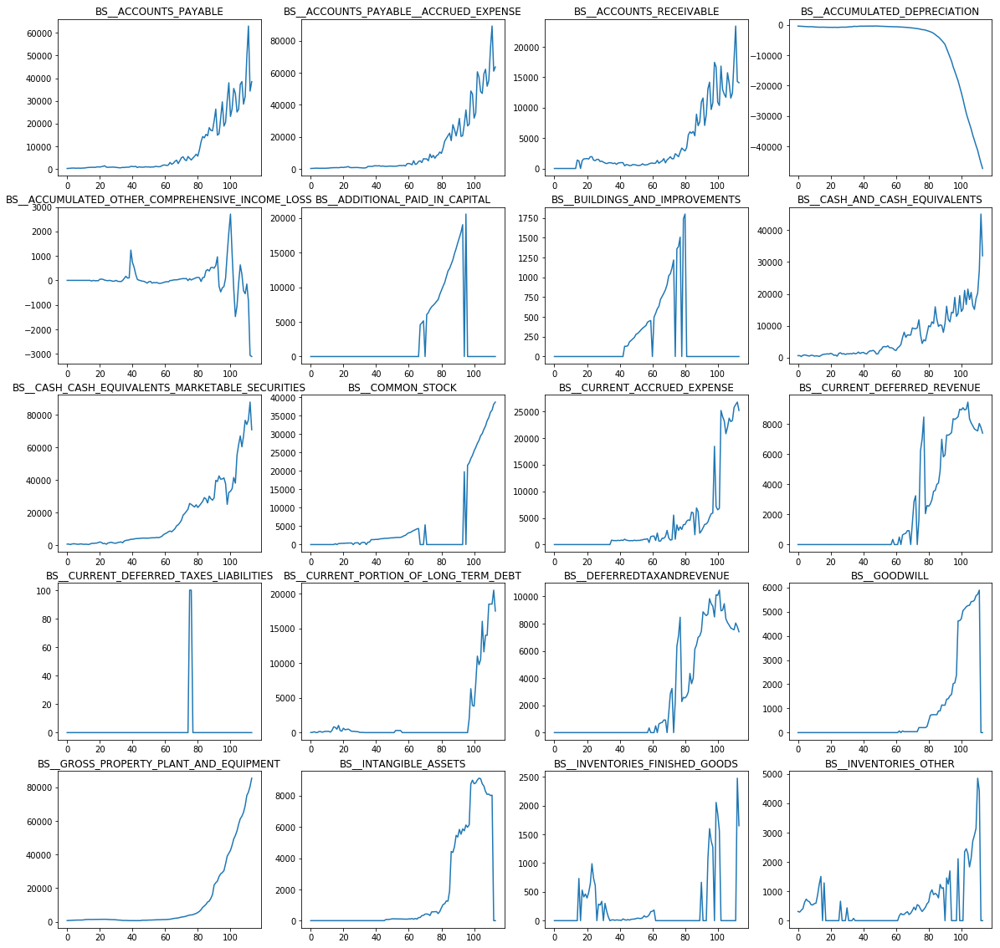

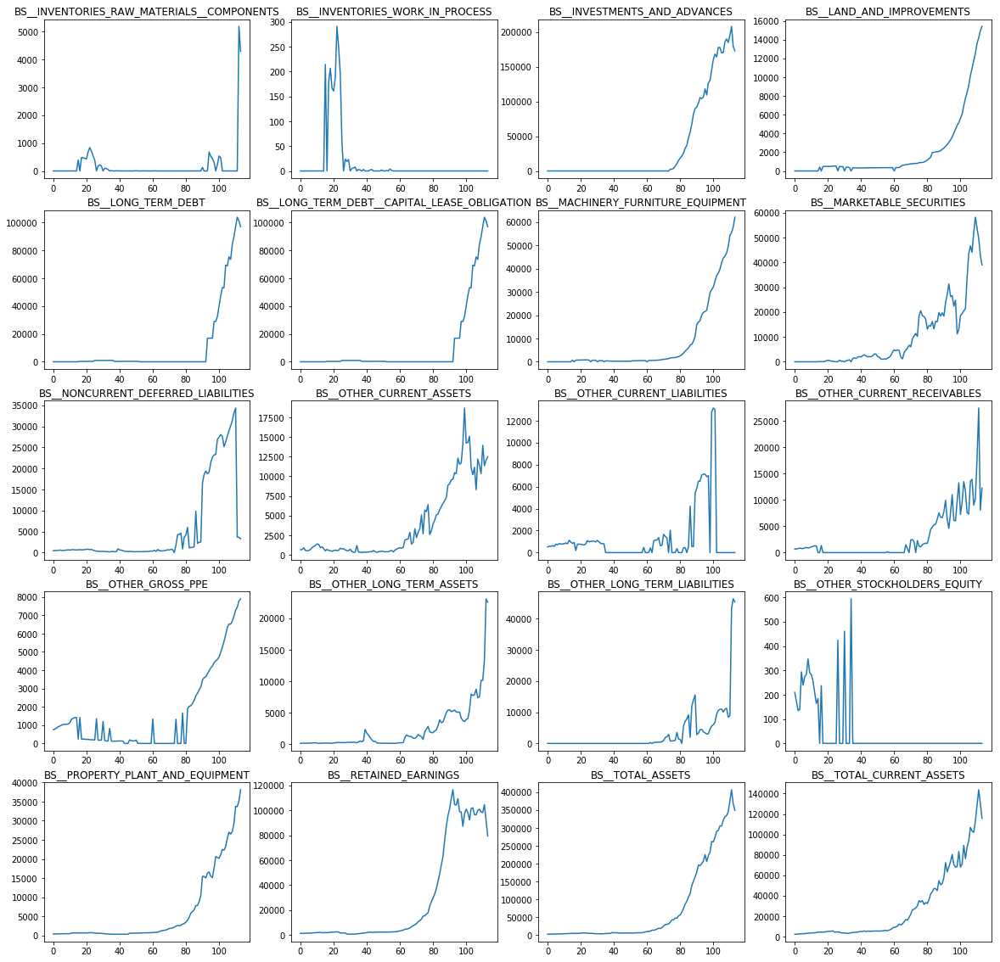

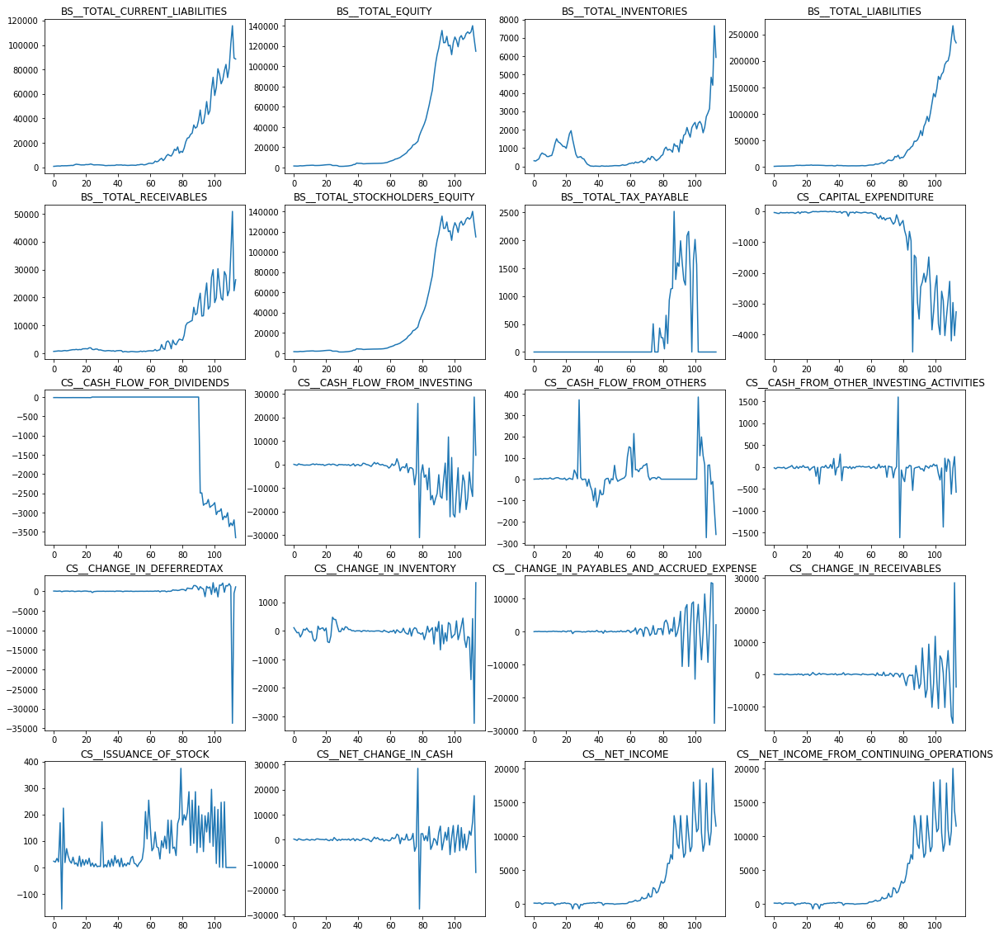

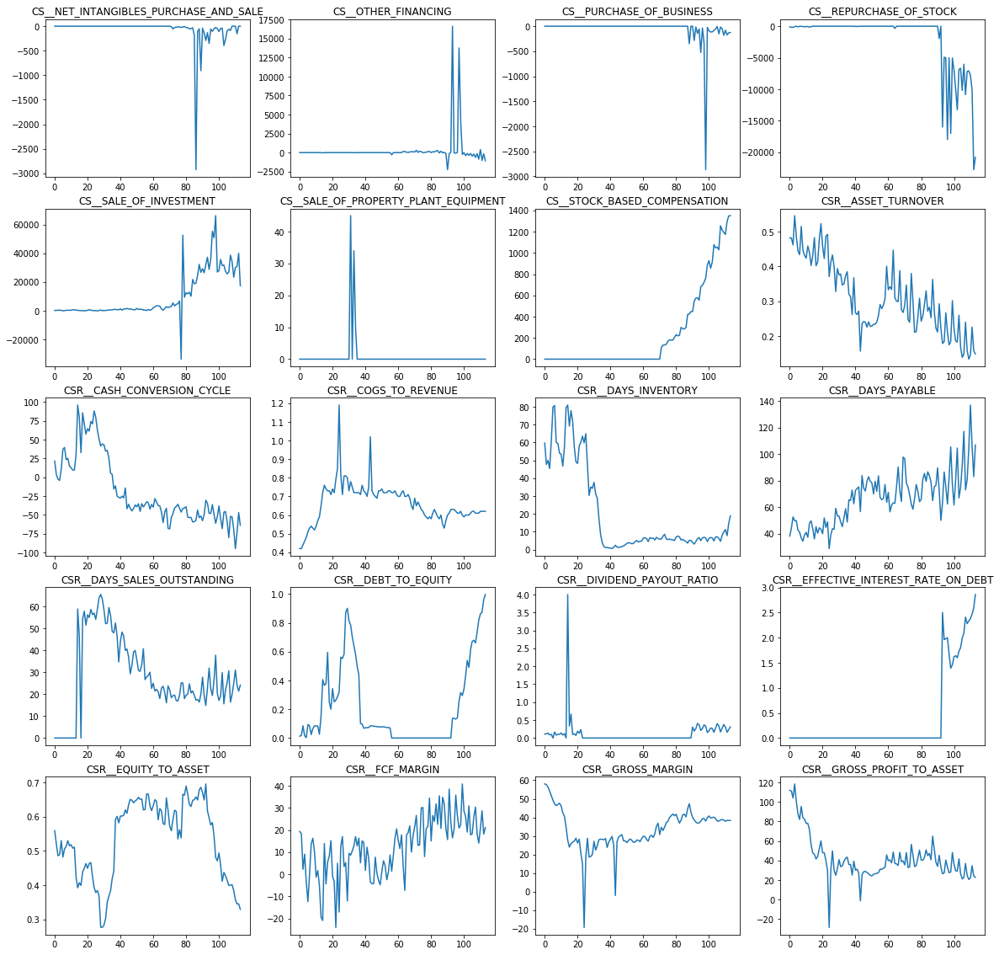

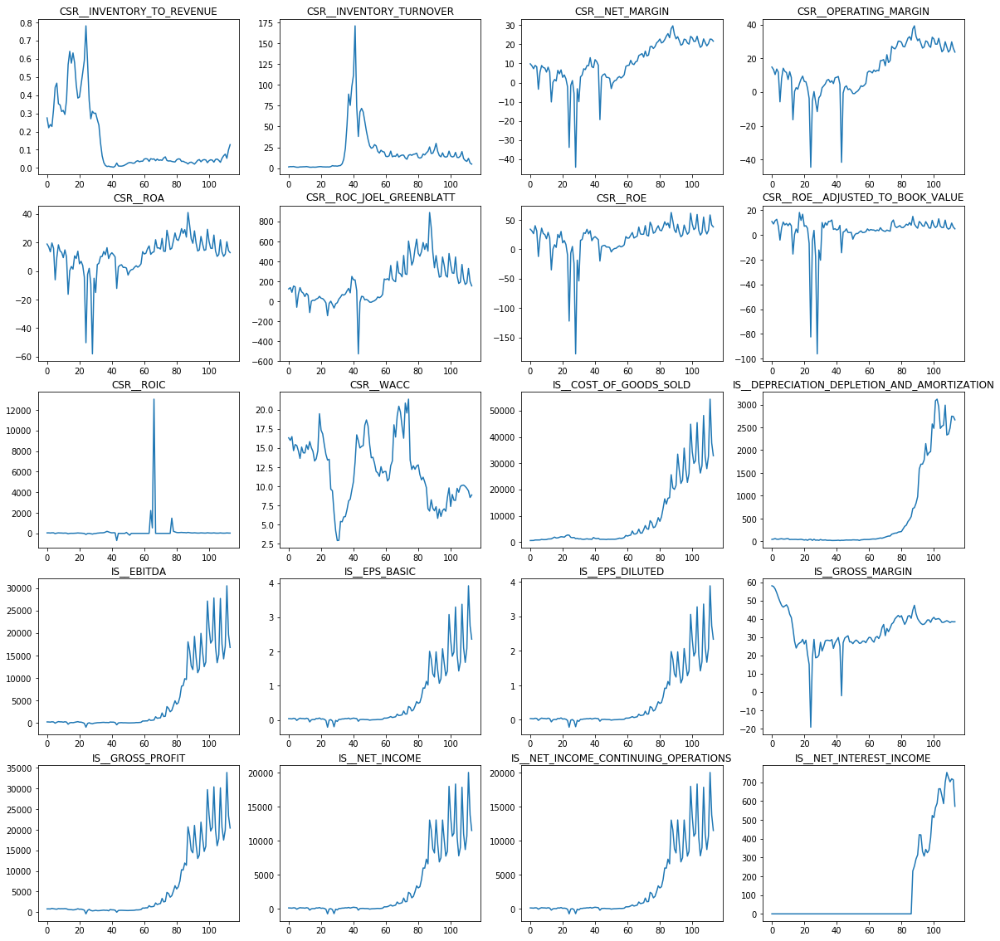

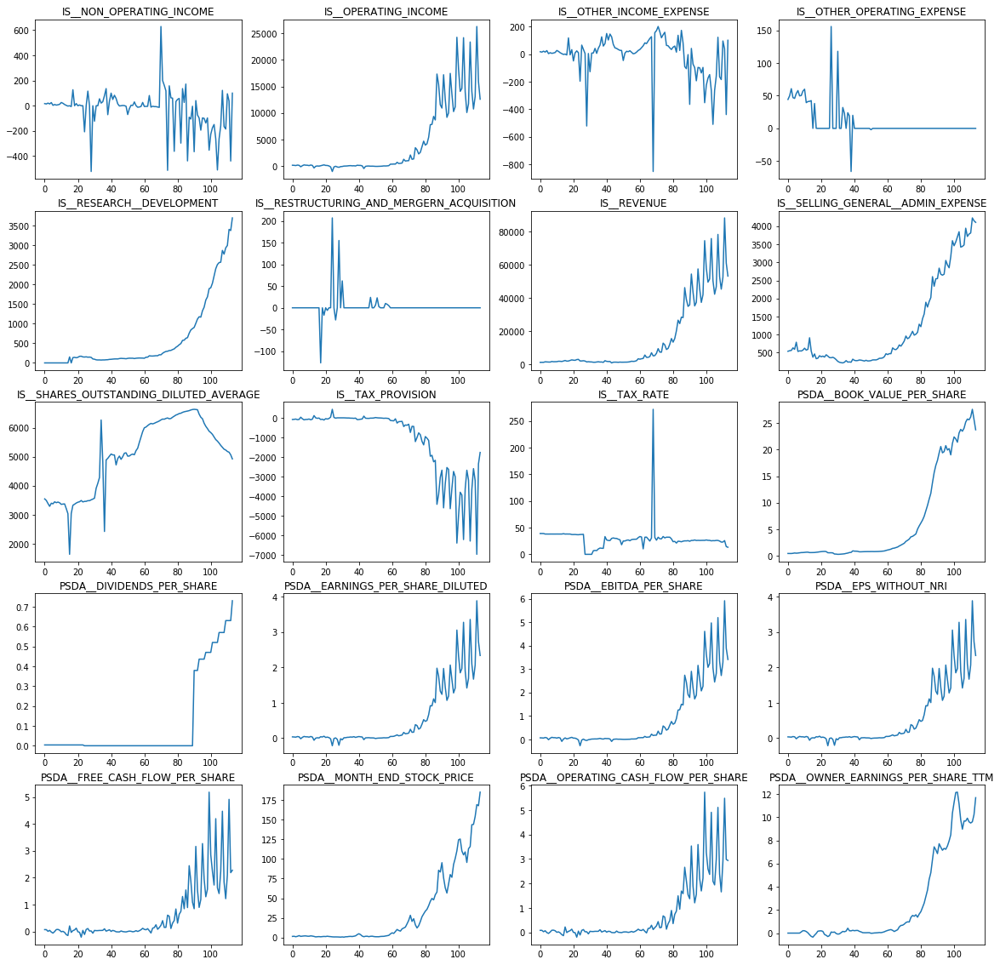

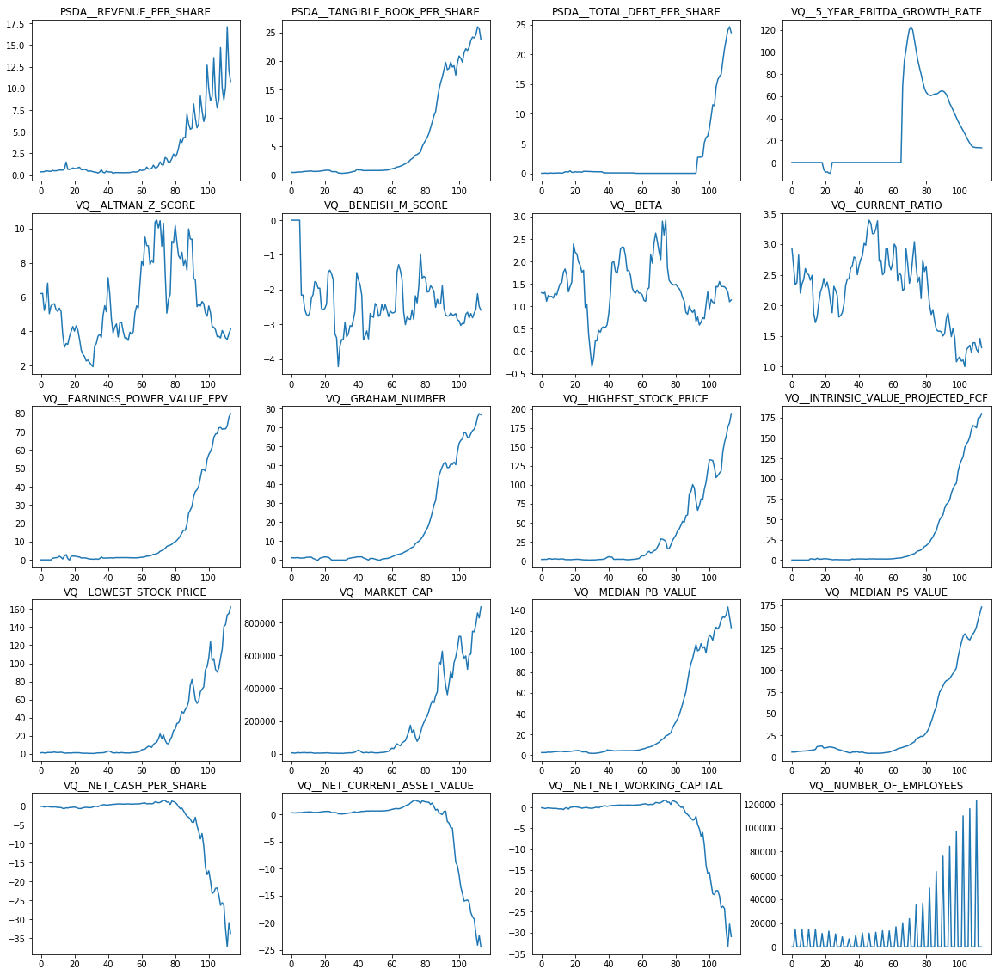

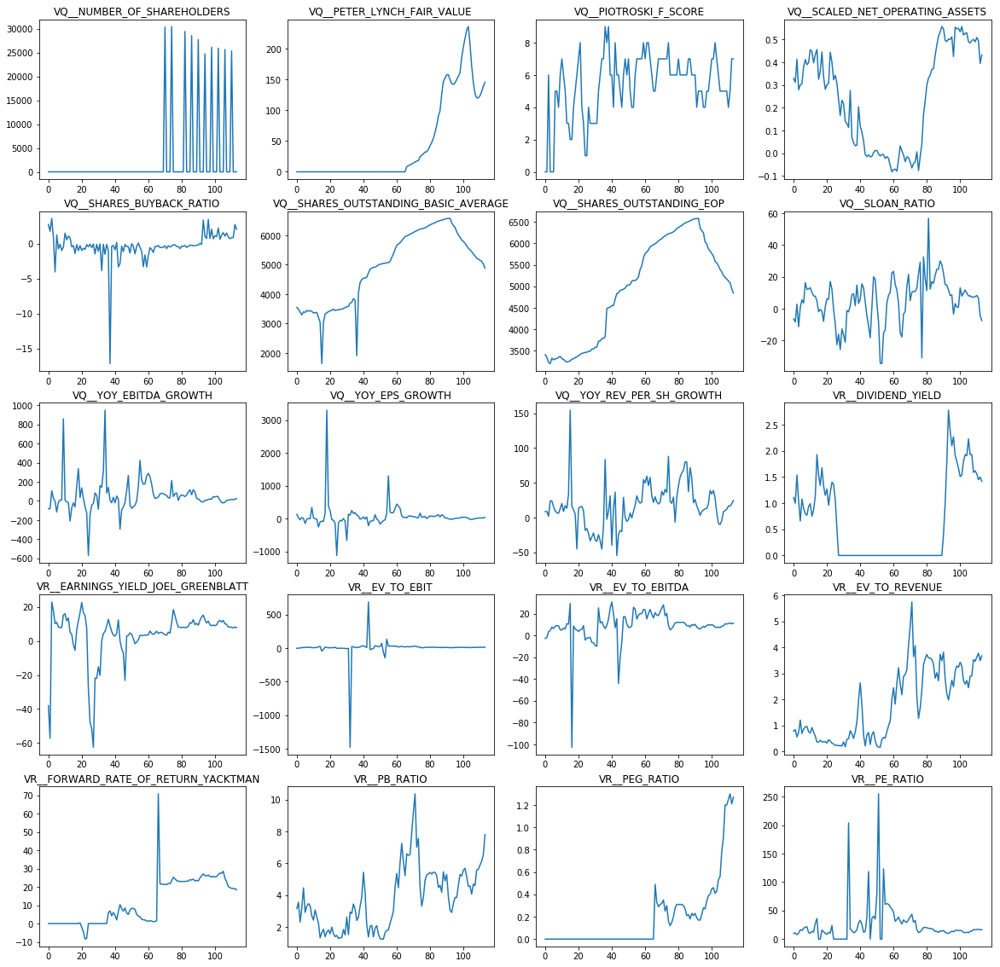

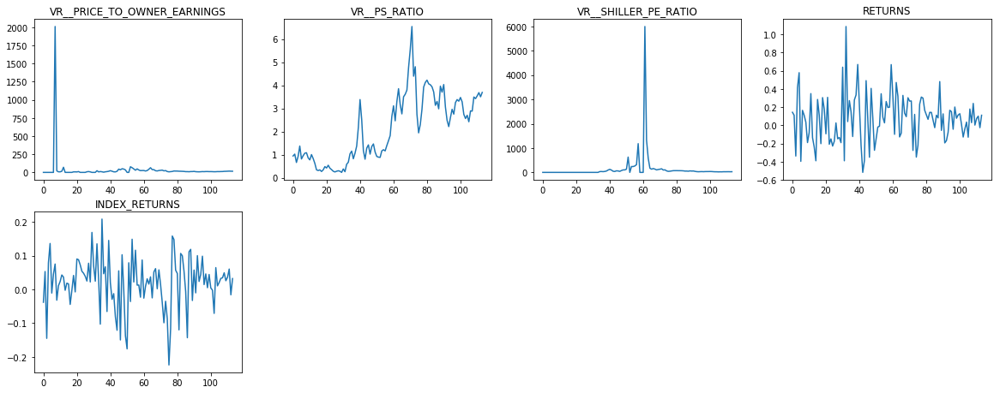

In [14]:
plt.clf()
i = 1
plt.figure(figsize=(20,20))
cols = dfApple.columns.drop(['Year','Month'])
for col in cols:    
    plt.subplot(5, 4, i)
    plt.plot(dfApple[col].values)
    plt.title(col)    
    if i == 20:
        i=0
        plt.show()
        plt.figure(figsize=(20,20))
    i += 1

Divido los datos en dos grupos, hasta el 2017 que lo uso para train/test y los datos del 2018 que los uso para validar los resultados.

In [15]:
dfApple['Year'] = pd.to_numeric(dfApple.Year)
dfApple_validacion = dfApple[dfApple['Year'] == 2018]
dfApple = dfApple[dfApple['Year'] < 2018]
dfApple_validacion

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,BS__ACCOUNTS_PAYABLE,BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE,BS__ACCOUNTS_RECEIVABLE,BS__ACCUMULATED_DEPRECIATION,BS__ACCUMULATED_OTHER_COMPREHENSIVE_INCOME_LOSS,BS__ADDITIONAL_PAID_IN_CAPITAL,BS__BUILDINGS_AND_IMPROVEMENTS,BS__CASH_AND_CASH_EQUIVALENTS,BS__CASH_CASH_EQUIVALENTS_MARKETABLE_SECURITIES,BS__COMMON_STOCK,...,VR__PB_RATIO,VR__PEG_RATIO,VR__PE_RATIO,VR__PRICE_TO_OWNER_EARNINGS,VR__PS_RATIO,VR__SHILLER_PE_RATIO,RETURNS,INDEX_RETURNS,Year,Month
56218,34311.0,61067.0,14324.0,-45425.0,-3064.0,0.0,0.0,45059.0,87940.0,38044.0,...,6.54,1.21,16.19,16.40,3.50,26.50,-0.026007,-0.015970,2018,03
56219,38489.0,63673.0,14104.0,-47251.0,-3111.0,0.0,0.0,31971.0,70970.0,38624.0,...,7.80,1.27,16.78,15.84,3.69,28.01,0.110571,0.032247,2018,06


### Aumentando la cantidad de muestras

Tengo muy pocas filas, para aumentar la cantidad de datos voy a usar la librería quandl y así obtener datos mensuales

In [16]:
quandl.ApiConfig.api_key = '-2oDXMAJy9HhcYzqFxBz'
pricesAppl = quandl.get("WIKI/AAPL", start_date="1990-01-01", end_date="2017-12-31")

In [17]:
pricesAppl.reset_index(inplace=True)
pricesAppl['Month'] = pricesAppl['Date'].dt.month
pricesAppl['Year'] = pricesAppl['Date'].dt.year
pricesAppl = pricesAppl.groupby(['Year','Month']).agg({'Open':'first', 'High':'max', 'Low':'min', 'Close':'last'})
pricesAppl['RETURNS'] = (pricesAppl['Close'] - pricesAppl['Open']) / pricesAppl['Open']
pricesAppl.head()

Open   High    Low  Close   RETURNS
Year Month                                      
1990 1      35.25  38.75  32.13  34.00 -0.035461
     2      34.50  35.25  32.25  34.00 -0.014493
     3      33.50  43.38  33.25  40.25  0.201493
     4      40.00  44.25  38.13  39.38 -0.015500
     5      39.75  42.75  38.75  41.25  0.037736

In [18]:
pricesAppl.reset_index(inplace=True)
pricesAppl.head()

,Year,Month,Open,High,Low,Close,RETURNS
0,1990,1,35.25,38.75,32.13,34.00,-0.035461
1,1990,2,34.50,35.25,32.25,34.00,-0.014493
2,1990,3,33.50,43.38,33.25,40.25,0.201493
3,1990,4,40.00,44.25,38.13,39.38,-0.015500
4,1990,5,39.75,42.75,38.75,41.25,0.037736


In [19]:
dfApple['Month'] = pd.to_numeric(dfApple.Month)
dfApple = pricesAppl.set_index(['Year','Month']).join(dfApple.set_index(['Year','Month']), lsuffix='_prices', rsuffix='_fin')
dfApple = dfApple.interpolate(method='linear')
dfApple = dfApple.dropna()
dfApple.head()

Open   High    Low  Close  RETURNS_prices  BS__ACCOUNTS_PAYABLE  \
Year Month                                                                     
1990 3      33.50  43.38  33.25  40.25        0.201493            235.800000   
     4      40.00  44.25  38.13  39.38       -0.015500            250.233333   
     5      39.75  42.75  38.75  41.25        0.037736            264.666667   
     6      41.38  44.88  37.50  44.75        0.081440            279.100000   
     7      44.50  47.75  40.00  42.00       -0.056180            299.600000   

            BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE  BS__ACCOUNTS_RECEIVABLE  \
Year Month                                                                   
1990 3                                 235.800000                      0.0   
     4                                 250.233333                      0.0   
     5                                 264.666667                      0.0   
     6                                 279.100000                      0.0   
     7                                 299.600000                      0.0   

            BS__ACCUMULATED_DEPRECIATION  \
Year Month                                 
1990 3                       -377.500000   
     4                       -389.900000   
     5                       -402.300000   
     6                       -414.700000   
     7                       -425.366667   

            BS__ACCUMULATED_OTHER_COMPREHENSIVE_INCOME_LOSS      ...        \
Year Month                                                       ...         
1990 3                                                  0.0      ...         
     4                                                  0.0      ...         
     5                                                  0.0      ...         
     6                                                  0.0      ...         
     7                                                  0.0      ...         

            VR__EV_TO_REVENUE  VR__FORWARD_RATE_OF_RETURN_YACKTMAN  \
Year Month                                                           
1990 3               0.780000                                  0.0   
     4               0.800000                                  0.0   
     5               0.820000                                  0.0   
     6               0.840000                                  0.0   
     7               0.746667                                  0.0   

            VR__PB_RATIO  VR__PEG_RATIO  VR__PE_RATIO  \
Year Month                                              
1990 3          3.160000            0.0     10.140000   
     4          3.293333            0.0     10.316667   
     5          3.426667            0.0     10.493333   
     6          3.560000            0.0     10.670000   
     7          3.146667            0.0      9.700000   

            VR__PRICE_TO_OWNER_EARNINGS  VR__PS_RATIO  VR__SHILLER_PE_RATIO  \
Year Month                                                                    
1990 3                              0.0      0.940000                   0.0   
     4                              0.0      0.966667                   0.0   
     5                              0.0      0.993333                   0.0   
     6                              0.0      1.020000                   0.0   
     7                              0.0      0.900000                   0.0   

            RETURNS_fin  INDEX_RETURNS  
Year Month                              
1990 3         0.142857      -0.038087  
     4         0.132275      -0.007663  
     5         0.121693       0.022762  
     6         0.111111       0.053186  
     7        -0.038452      -0.012929  

[5 rows x 170 columns]

### Persistence model

In [20]:
# persistence model
def model_persistence(x):
    return x

In [21]:
def create_model(serie, split_value):
    # create lagged dataset
    values = pd.DataFrame(serie.values)
    dataframe = pd.concat([values.shift(1), values], axis=1)
    dataframe.columns = ['t', 't+1']
    # split into train and test sets
    X = dataframe.values
    limite = int(len(X)*split_value)
    if split_value == 1:
        limite = 1
    train, test = X[1:len(X)-limite], X[len(X)-limite:]    
    train_X, train_y = train[:,0], train[:,1]
    test_X, test_y = test[:,0], test[:,1]

    # walk-forward validation
    predictions = list()
    for x in test_X:
        yhat = model_persistence(x)
        predictions.append(yhat)
    rmse = sqrt(mean_squared_error(test_y, predictions))
    return test_y,predictions,rmse    

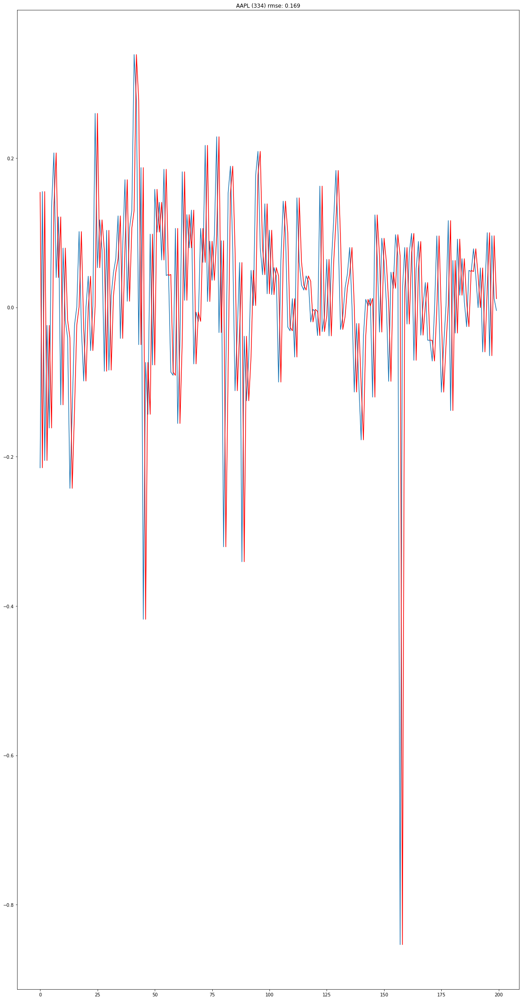

In [22]:
plt.clf()
i = 1
plt.figure(figsize=(20,40))
persistence_model = list()
#for c in lista_companyas_def:    
#plt.subplot(4, 5, i)
group = dfApple.loc[:,'RETURNS_prices']
test_y,predictions,rmse = create_model(group, 0.6)
strRmse = ') rmse: %.3f'%rmse
title = 'AAPL (' + str(len(group)) + strRmse
plt.title(title)
# plot predictions vs expected
plt.plot(test_y)
plt.plot(predictions, color='red')

In [23]:
#Predigo solo el último valor, es decir, para el 2017 devuelvo lo mismo que obtuve en 2016
#El rmse será el error producido entre el valor real de 2017 y el que se devolvió (valor a 2016)
#Esto me va a servir para comparar este modelo con el resto
persistence_model = list()
#for code, group in seriePorSimbolo:    
test_y,predictions,rmse = create_model(group, 1)                                                     
#persistence_model.append({'code': code, 'prediction':predictions, 'rmse': rmse})

### VAR (Vector Auto Regression)

Partiendo del modelo anterior, vamos a aplicar distintos algoritmos que lo mejoren. El primero de ellos será VAR.

In [24]:
dfApple.reset_index(inplace=True)
dfApple['Year'] = dfApple['Year'].apply(lambda x: str(x))
dfApple['Month'] = dfApple['Month'].apply(lambda x: str(x).zfill(2))
dfApple['Date'] = (dfApple['Year']) + str('-') + (dfApple['Month'])
dfApple['Date'] = pd.to_datetime(dfApple['Date'])
dfApple.set_index('Date', inplace=True)
dfApple.head()

,Year,Month,Open,High,Low,Close,RETURNS_prices,BS__ACCOUNTS_PAYABLE,BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE,BS__ACCOUNTS_RECEIVABLE,...,VR__EV_TO_REVENUE,VR__FORWARD_RATE_OF_RETURN_YACKTMAN,VR__PB_RATIO,VR__PEG_RATIO,VR__PE_RATIO,VR__PRICE_TO_OWNER_EARNINGS,VR__PS_RATIO,VR__SHILLER_PE_RATIO,RETURNS_fin,INDEX_RETURNS
Date,,,,,,,,,,,,,,,,,,,,,
1990-03-01,1990,03,33.50,43.38,33.25,40.25,0.201493,235.800000,235.800000,0.0,...,0.780000,0.0,3.160000,0.0,10.140000,0.0,0.940000,0.0,0.142857,-0.038087
1990-04-01,1990,04,40.00,44.25,38.13,39.38,-0.015500,250.233333,250.233333,0.0,...,0.800000,0.0,3.293333,0.0,10.316667,0.0,0.966667,0.0,0.132275,-0.007663
1990-05-01,1990,05,39.75,42.75,38.75,41.25,0.037736,264.666667,264.666667,0.0,...,0.820000,0.0,3.426667,0.0,10.493333,0.0,0.993333,0.0,0.121693,0.022762
1990-06-01,1990,06,41.38,44.88,37.50,44.75,0.081440,279.100000,279.100000,0.0,...,0.840000,0.0,3.560000,0.0,10.670000,0.0,1.020000,0.0,0.111111,0.053186
1990-07-01,1990,07,44.50,47.75,40.00,42.00,-0.056180,299.600000,299.600000,0.0,...,0.746667,0.0,3.146667,0.0,9.700000,0.0,0.900000,0.0,-0.038452,-0.012929


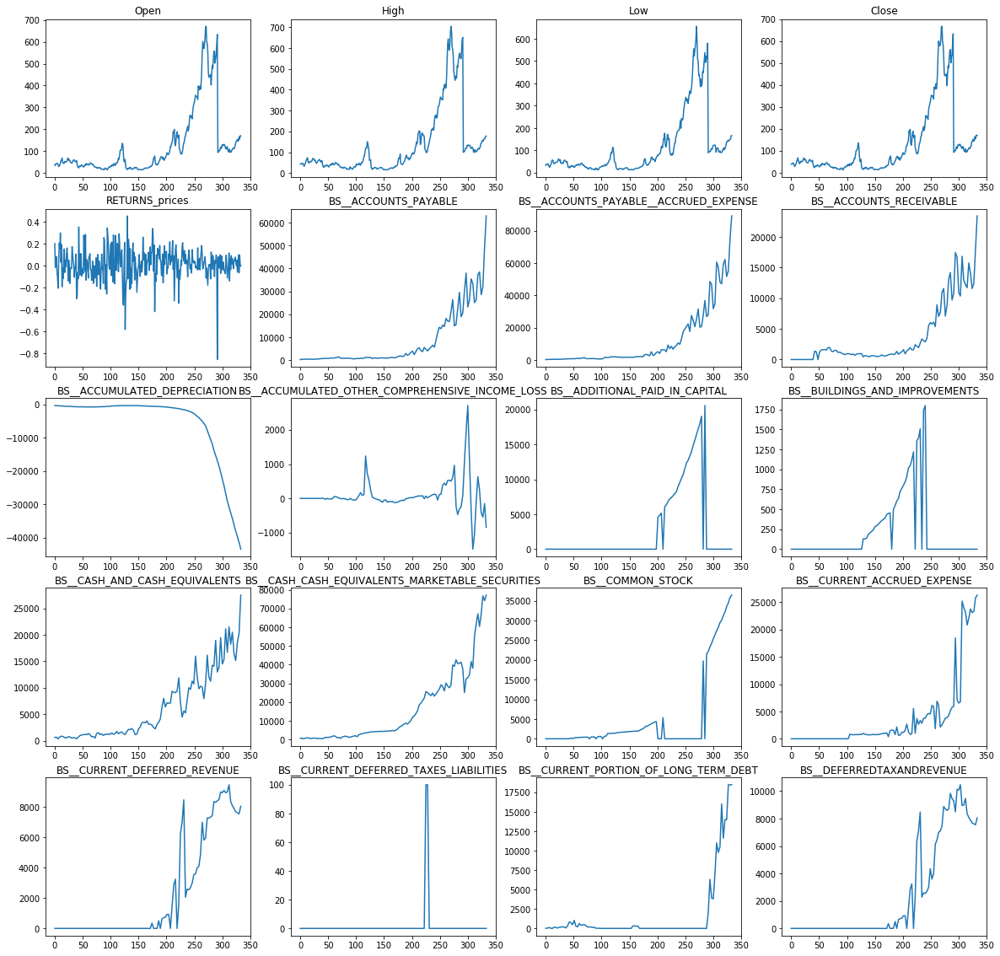

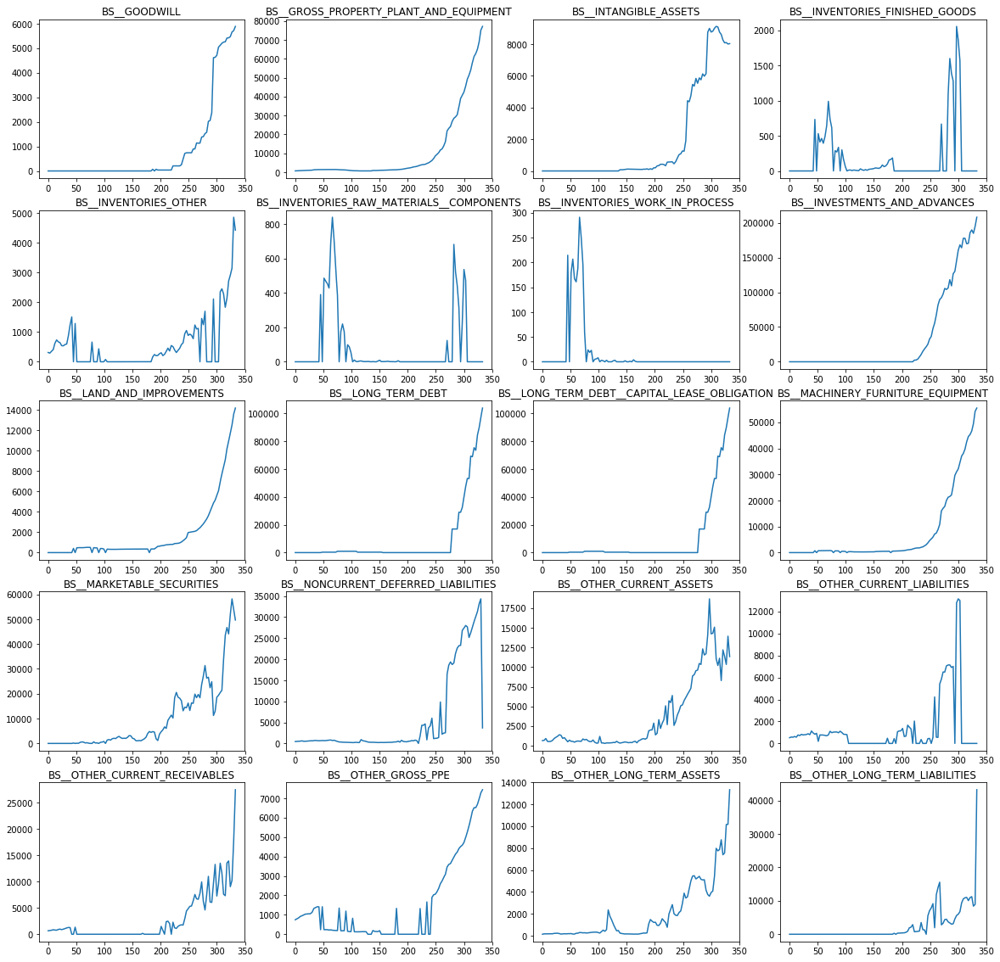

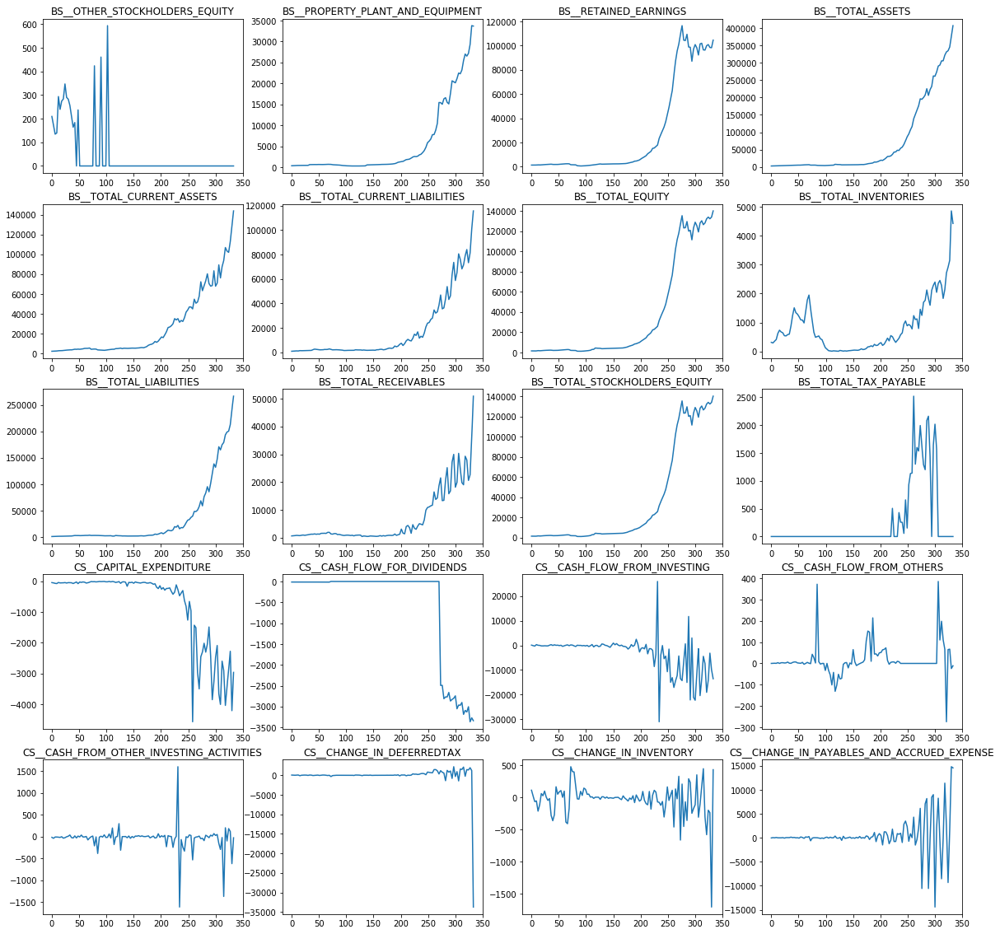

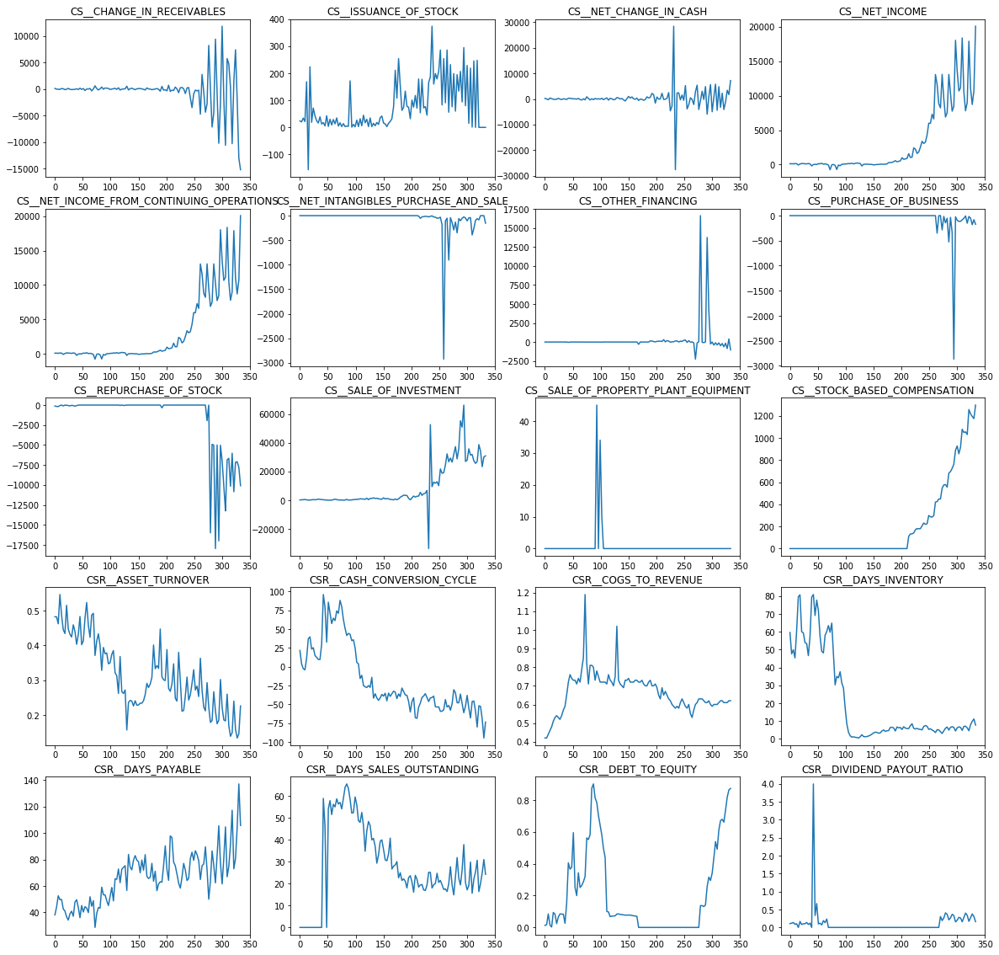

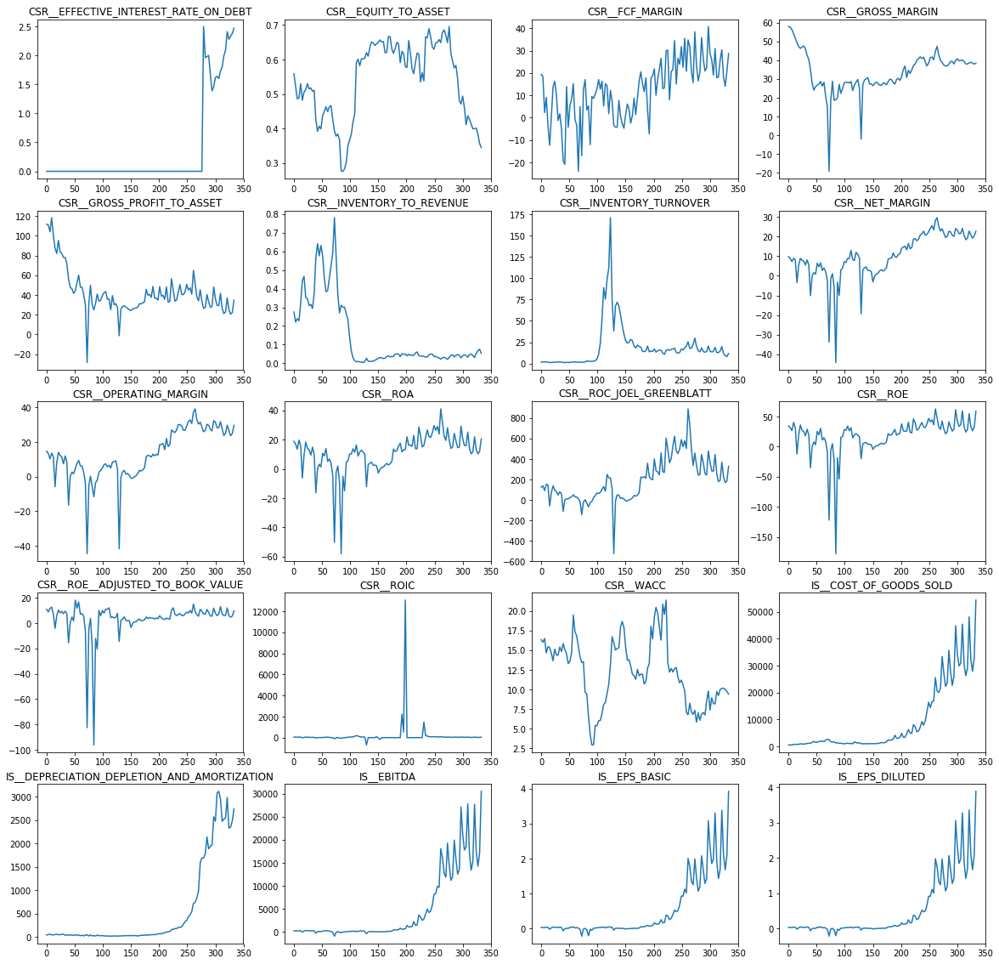

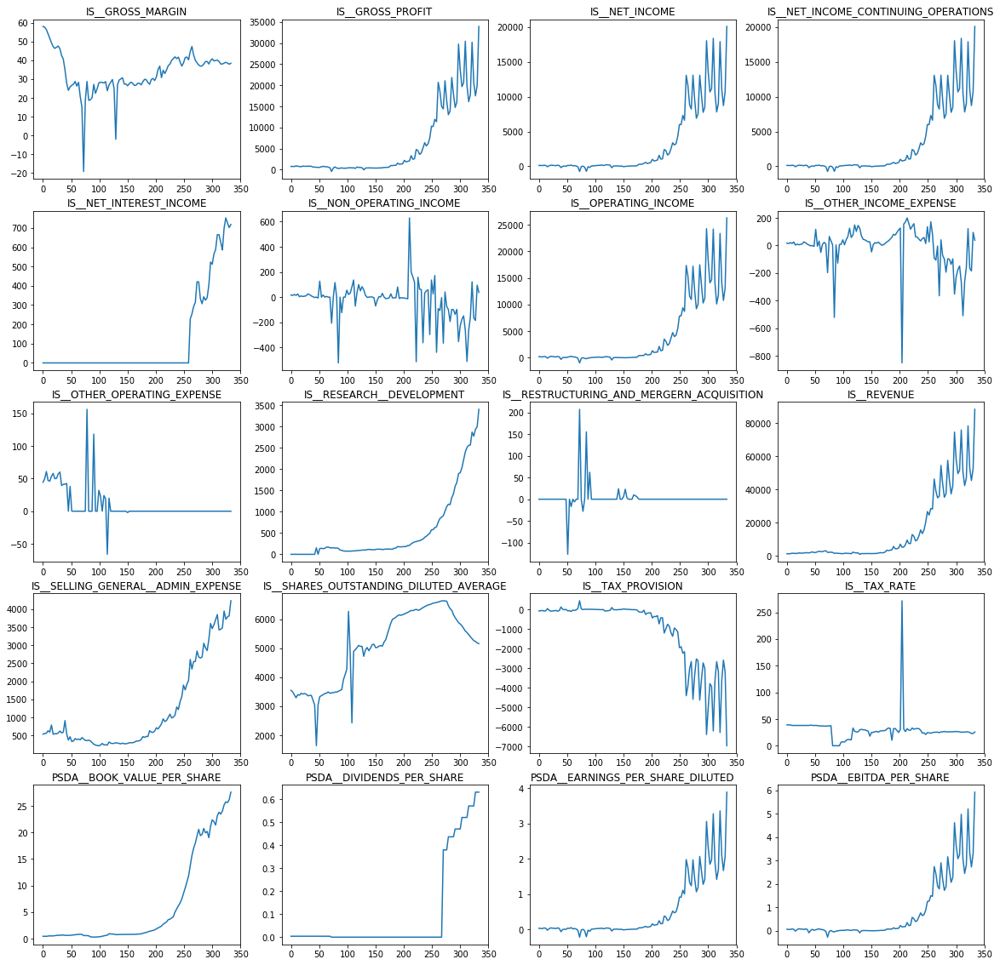

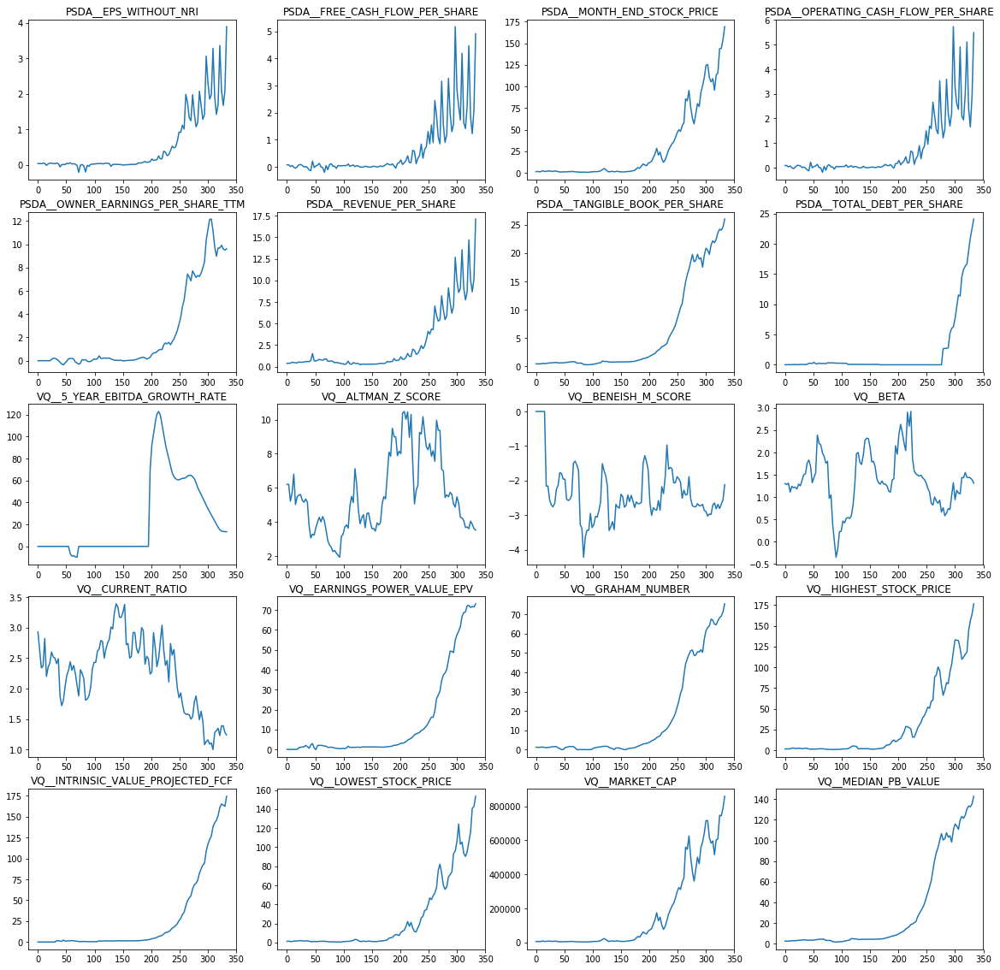

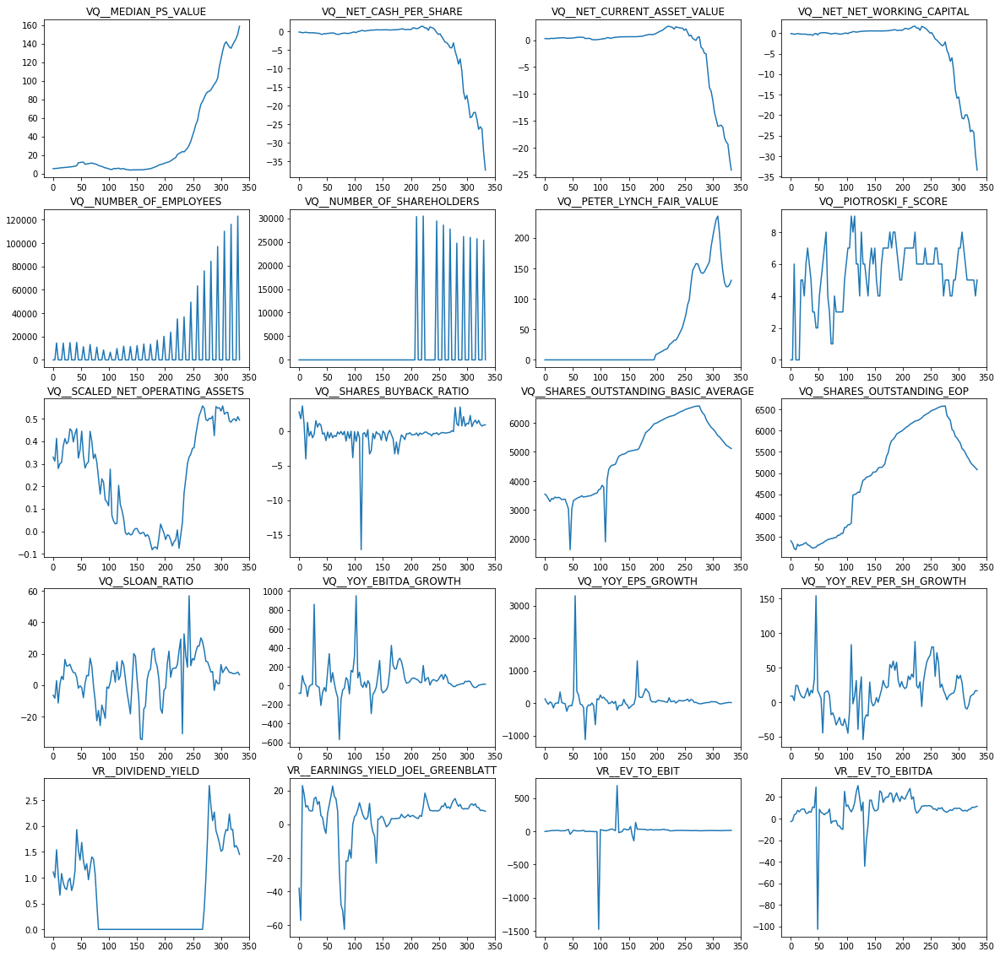

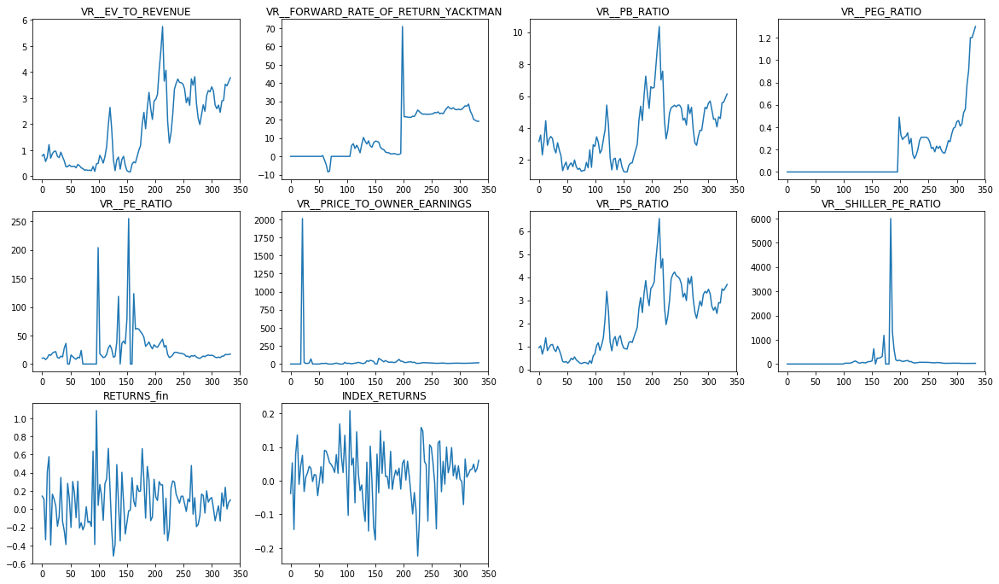

In [25]:
dfApple.drop(['Year','Month'], axis=1, inplace=True)
plt.clf()
i = 1
plt.figure(figsize=(20,20))
cols = dfApple.columns
for col in cols:    
    plt.subplot(5, 4, i)
    plt.plot(dfApple[col].values)
    plt.title(col)    
    if i == 20:
        i=0
        plt.show()
        plt.figure(figsize=(20,20))
    i += 1

In [26]:
columnas_seleccionadas = ['CSR__ROC_JOEL_GREENBLATT','VQ__PIOTROSKI_F_SCORE',
                          'PSDA__EARNINGS_PER_SHARE_DILUTED',
                          'PSDA__EBITDA_PER_SHARE','PSDA__TOTAL_DEBT_PER_SHARE','CSR__NET_MARGIN',
                          'IS__REVENUE','IS__NET_INCOME','IS__COST_OF_GOODS_SOLD','BS__TOTAL_EQUITY','IS__EBITDA',
                          'BS__TOTAL_ASSETS','BS__LONG_TERM_DEBT','BS__TOTAL_CURRENT_LIABILITIES','RETURN_fin']
dfApple = dfApple.loc[:,columnas_seleccionadas]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1367: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


In [27]:
from statsmodels.tsa.vector_ar.var_model import VAR

#creating the train and validation set
train = dfApple[:int(0.8*(len(dfApple)))]
valid = dfApple[int(0.8*(len(dfApple))):]

#fit the model
model = VAR(endog=train)
model_fit = model.fit()

# make prediction on validation    
p = model_fit.forecast(model_fit.y, steps=len(valid))
#predictions.append({'codigo':c, 'prediction':p, 'valid': valid})


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:52: RuntimeWarning: invalid value encountered in reduce
  return getattr(obj, method)(*args, **kwds)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\vector_ar\var_model.py:461: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  params = np.linalg.lstsq(z, y_sample)[0]


In [28]:
p

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

Con los datos disponibles no hemos podido realizar una predicción. Vamos con la siguiente empresa

### ABT

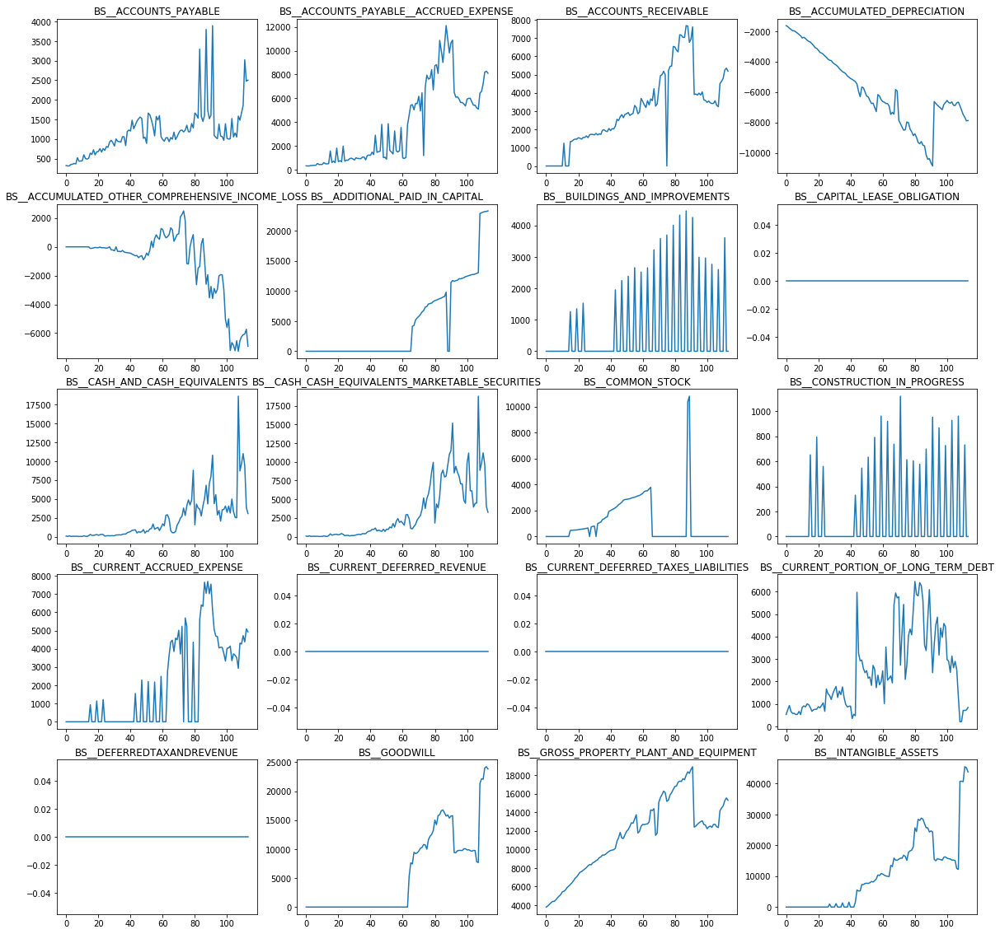

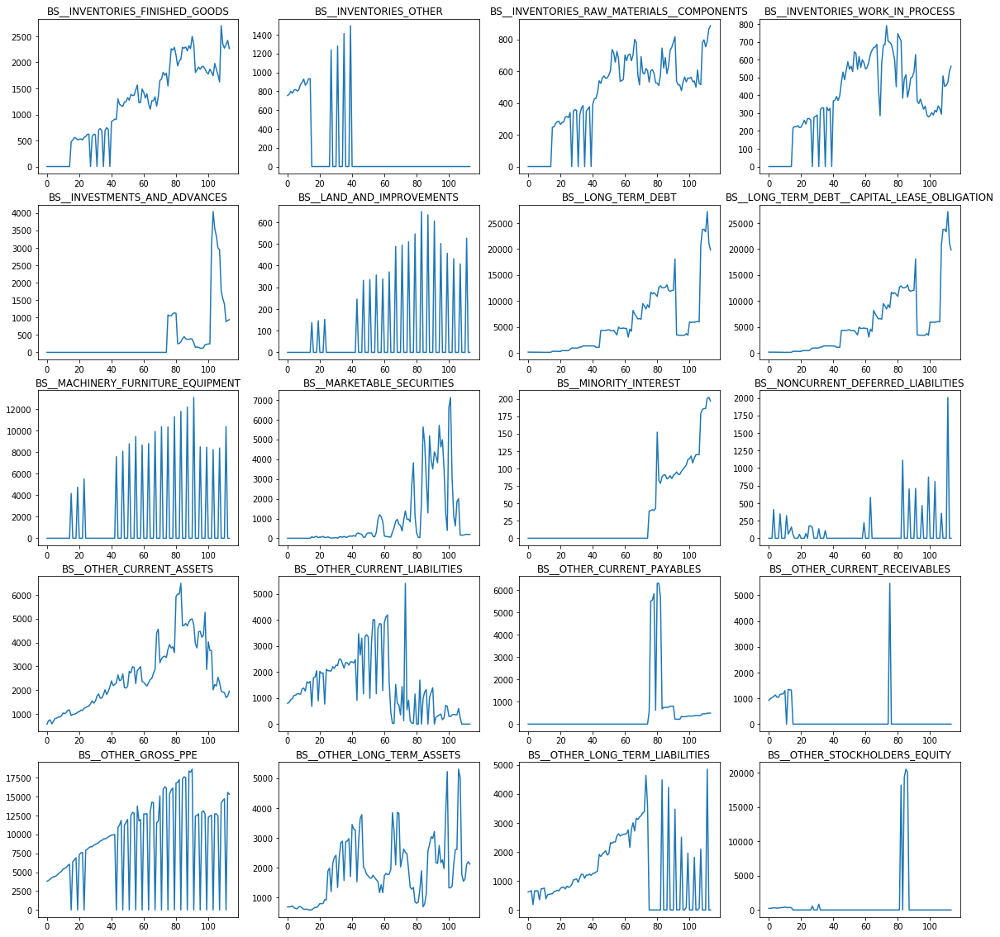

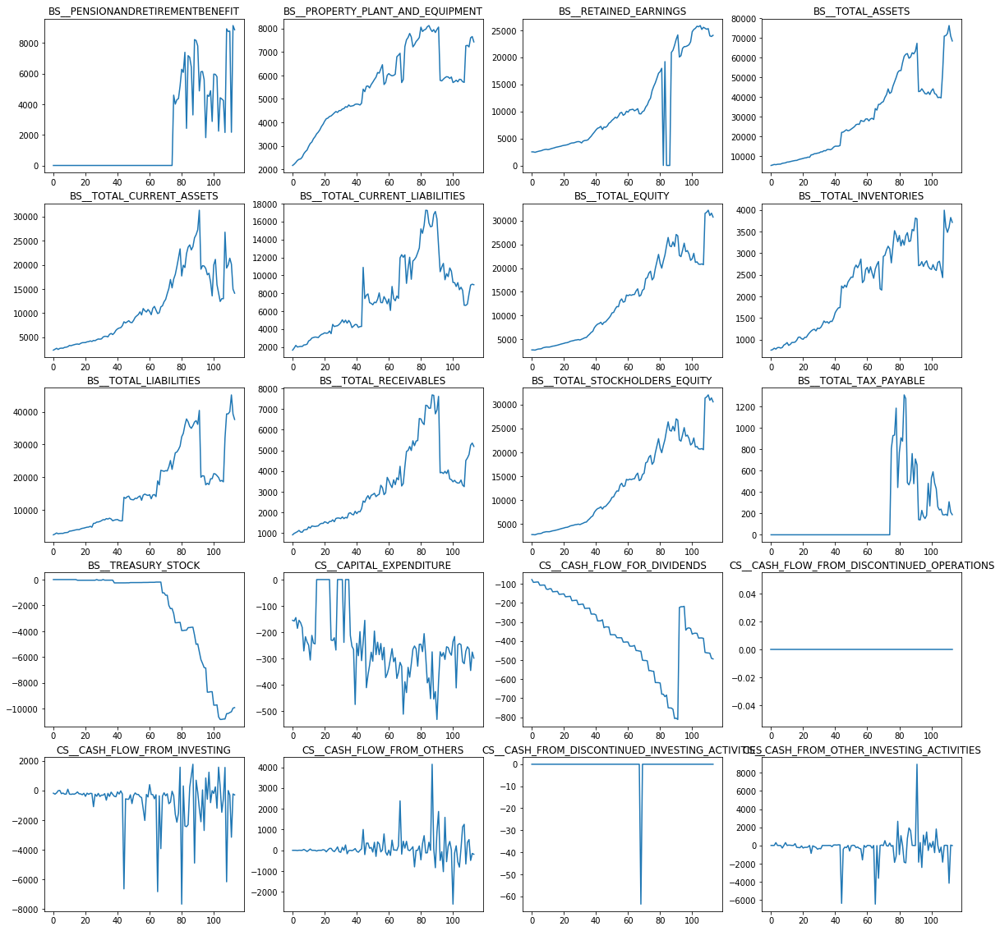

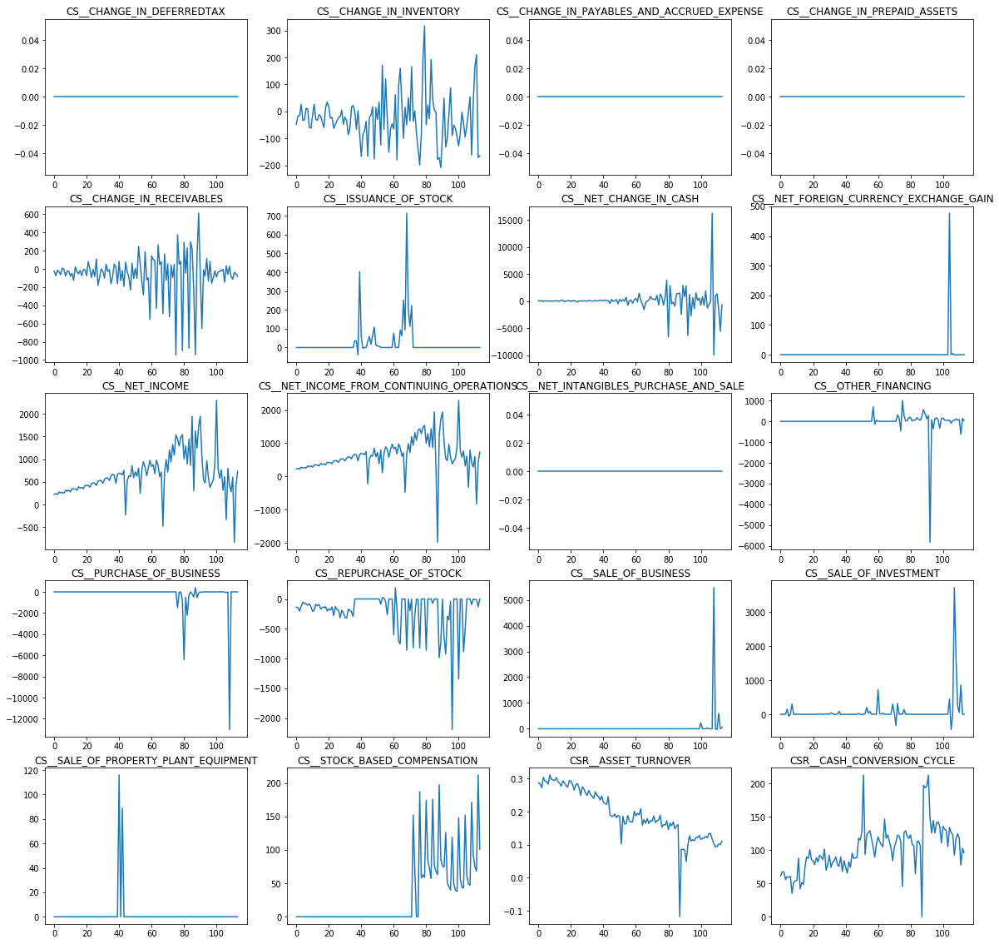

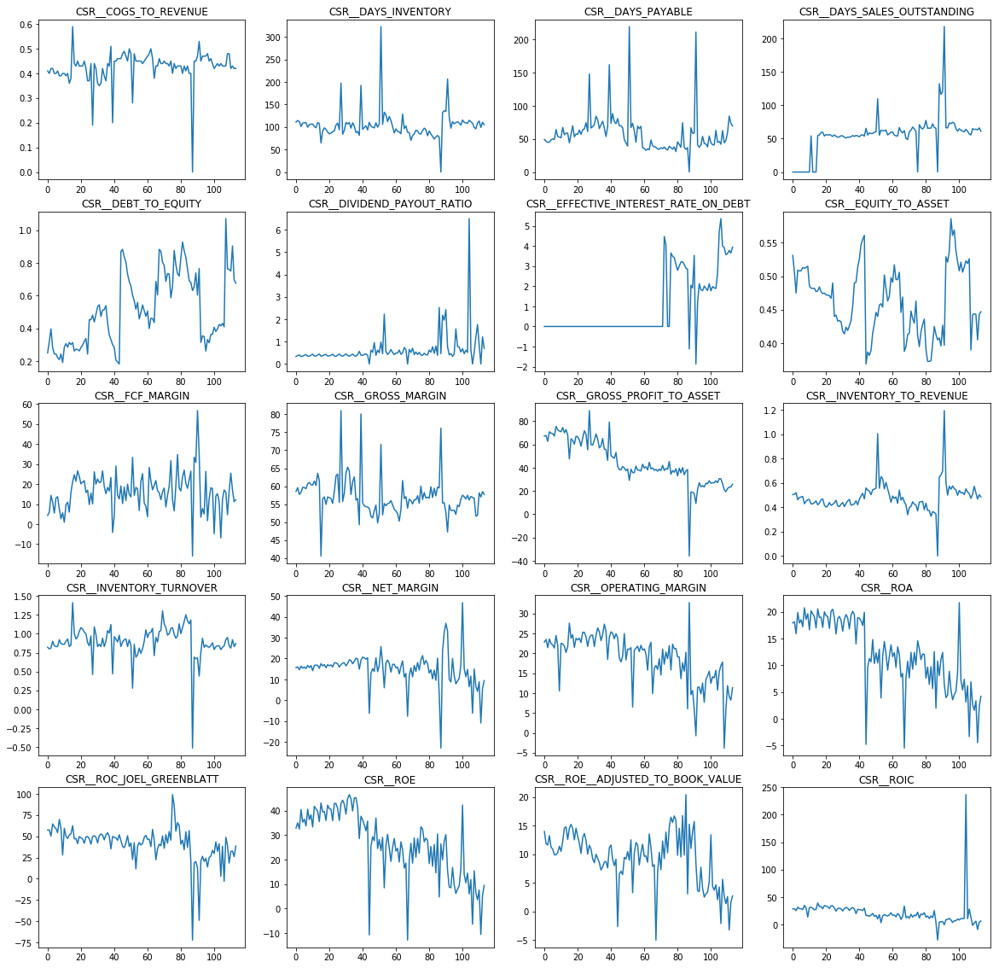

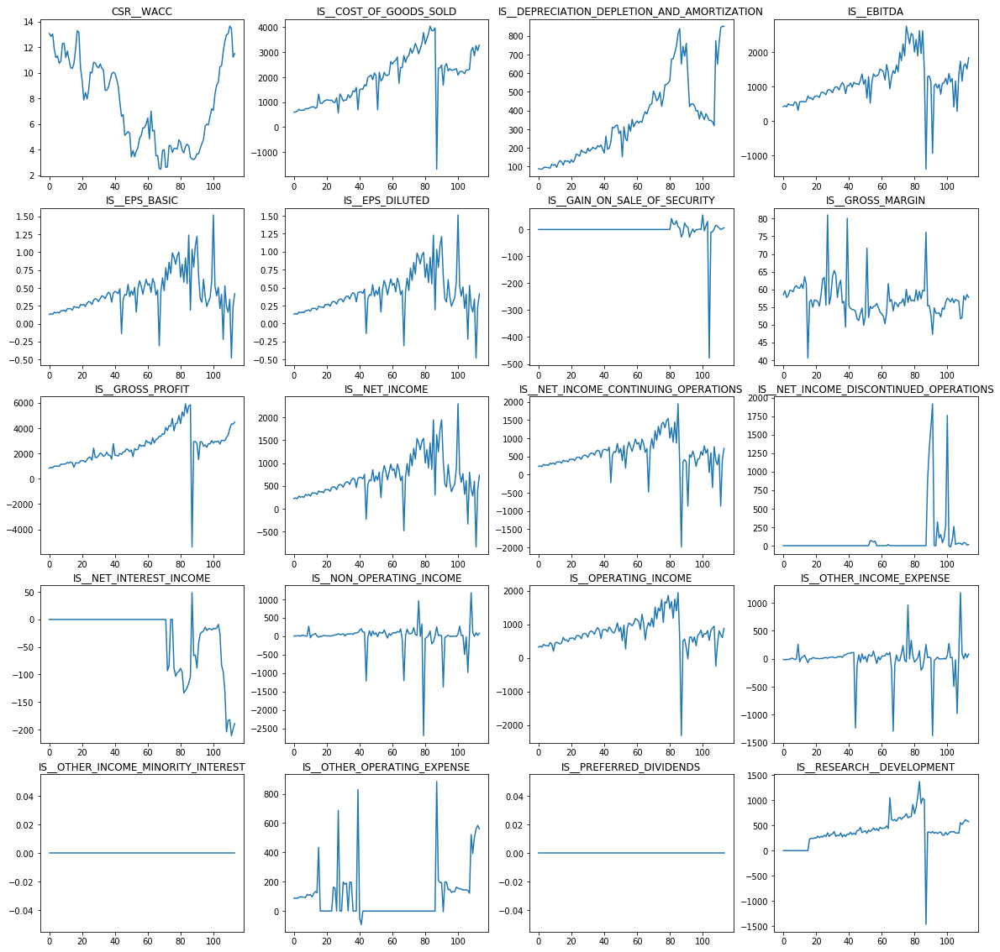

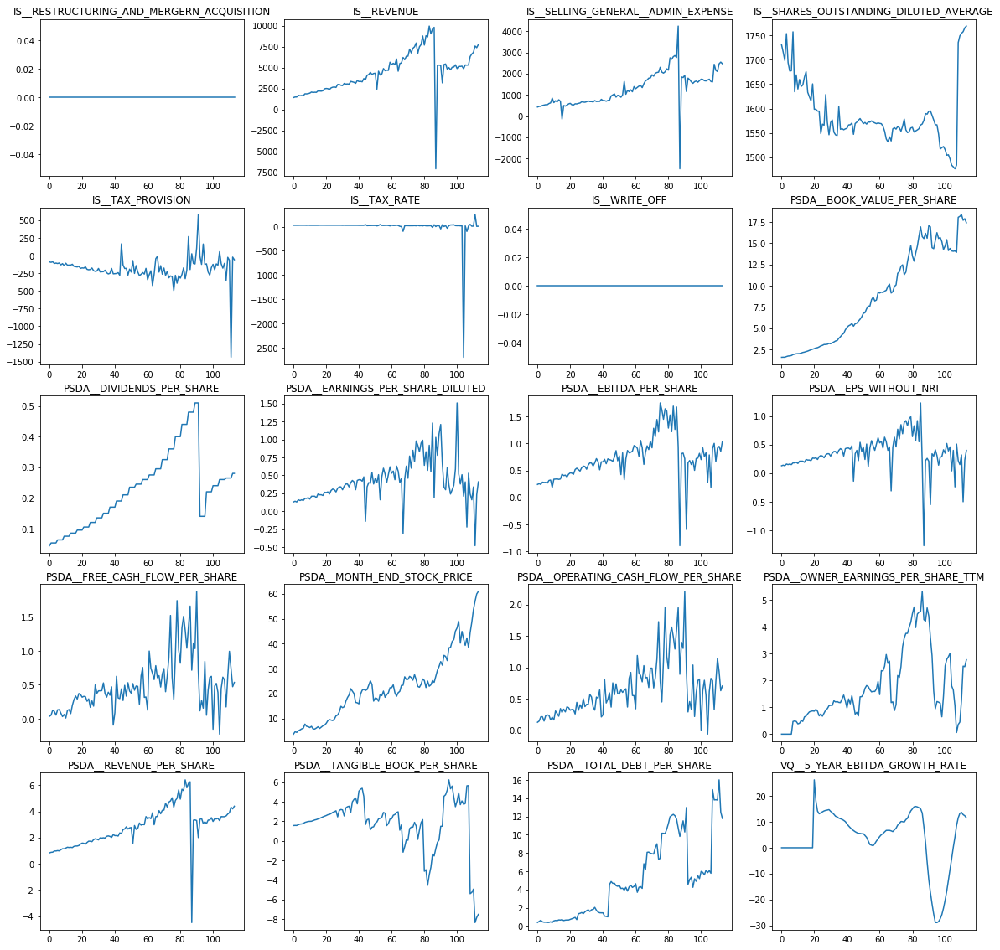

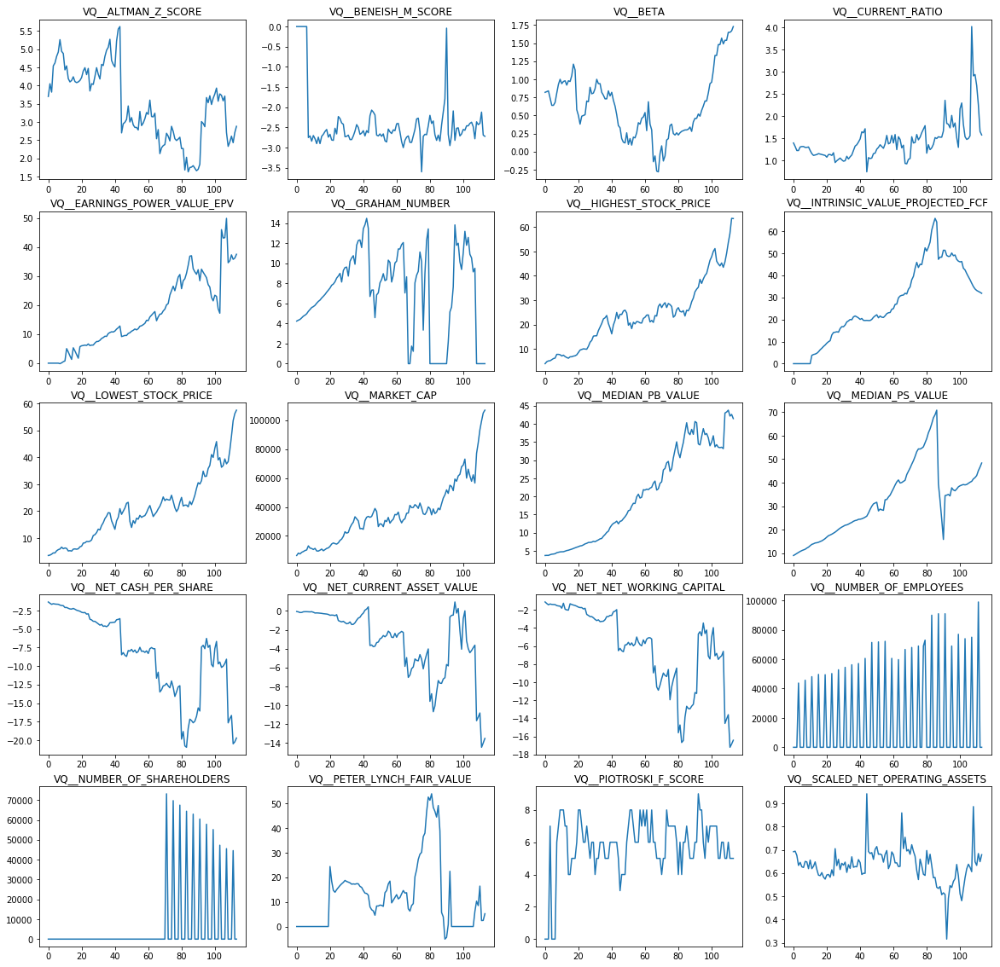

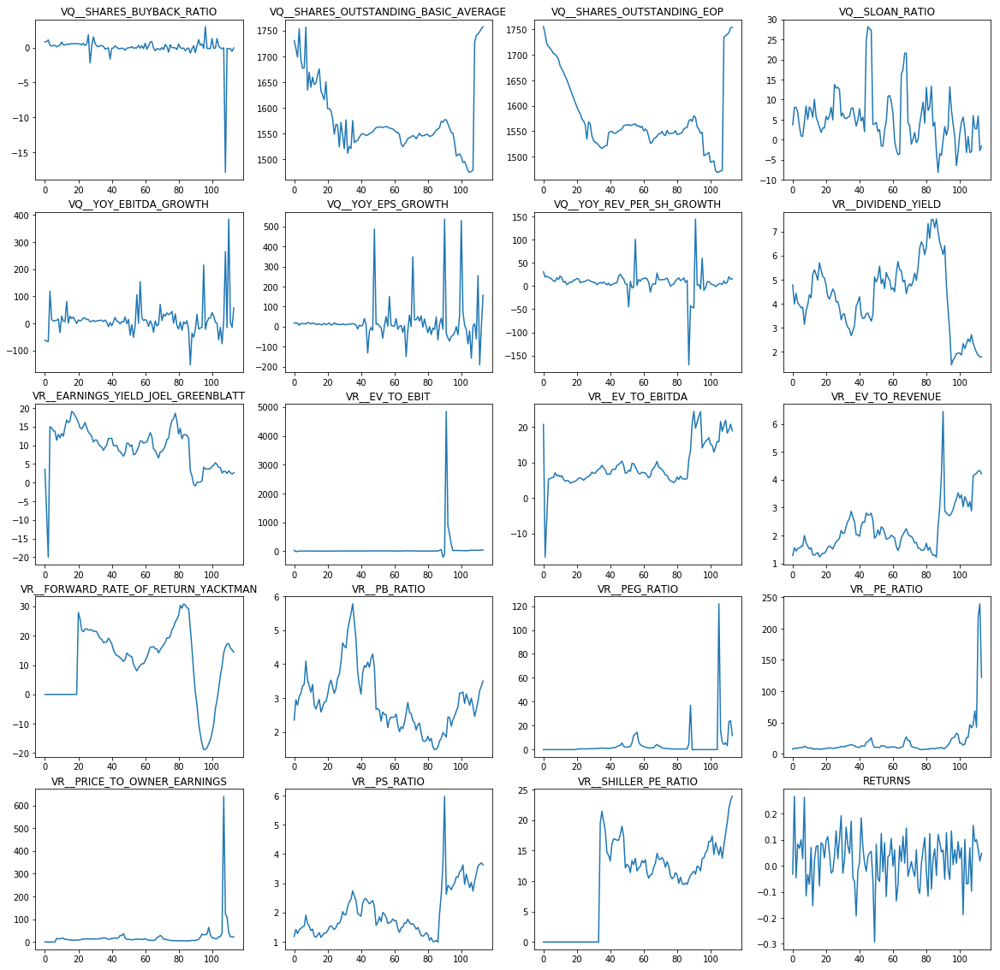

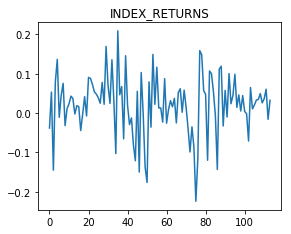

In [36]:
#ABT
plt.clf()
i = 1
plt.figure(figsize=(20,20))
df = financialDF[financialDF['Ticker'] == 'ABT']
cols = df.columns.drop(['Ticker','Year','Month'])
for col in cols:    
    plt.subplot(5, 4, i)
    plt.plot(df[col].values)
    plt.title(col)    
    if i == 20:
        i=0
        plt.show()
        plt.figure(figsize=(20,20))
    i += 1

Vuelven a salir columnas a cero, las voy a quitar

In [37]:
columns_to_drop = []
dfAbt = financialDF[financialDF['Ticker'] == 'ABT']
cols = dfAbt.columns.drop(['Ticker','Year', 'Month'])
for c in cols:    
    if dfAbt[c].sum() == 0:         
        columns_to_drop.append(c)
dfAbt.drop(columns_to_drop, axis=1, inplace=True)
dfAbt.drop(['Ticker'], axis=1, inplace=True)
dfAbt.shape 

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


(114, 170)

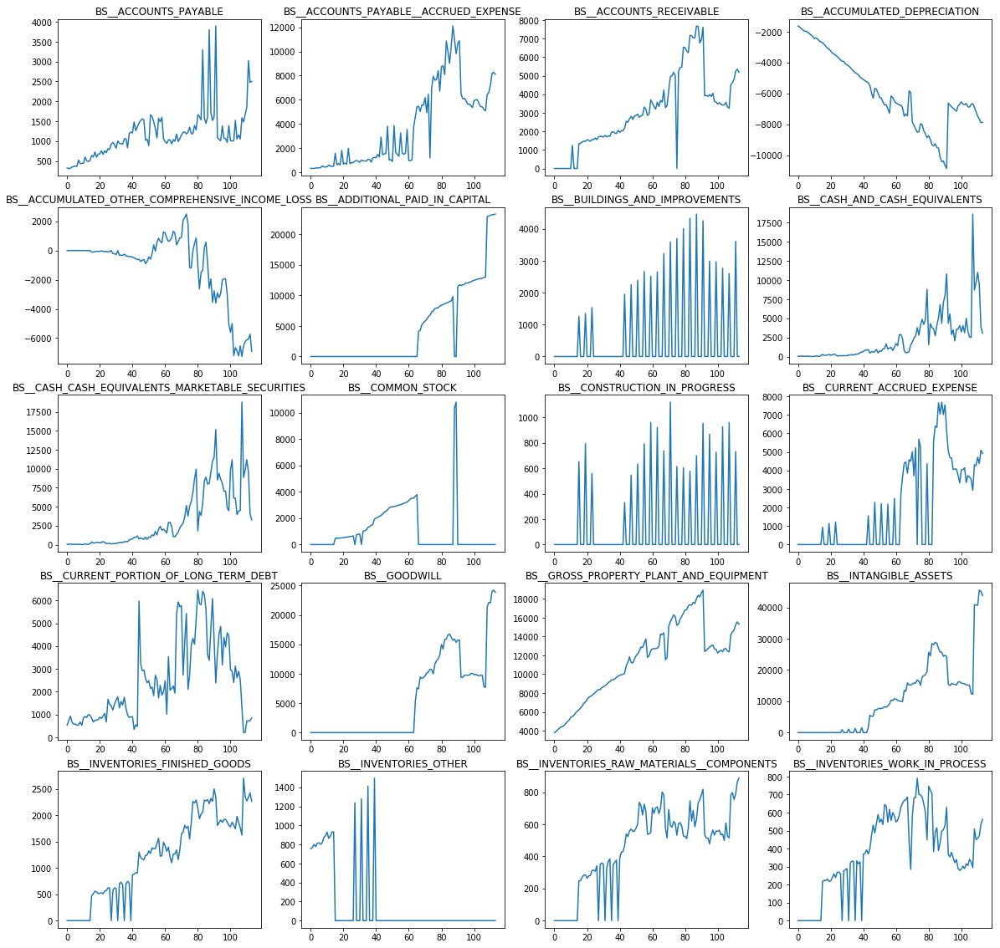

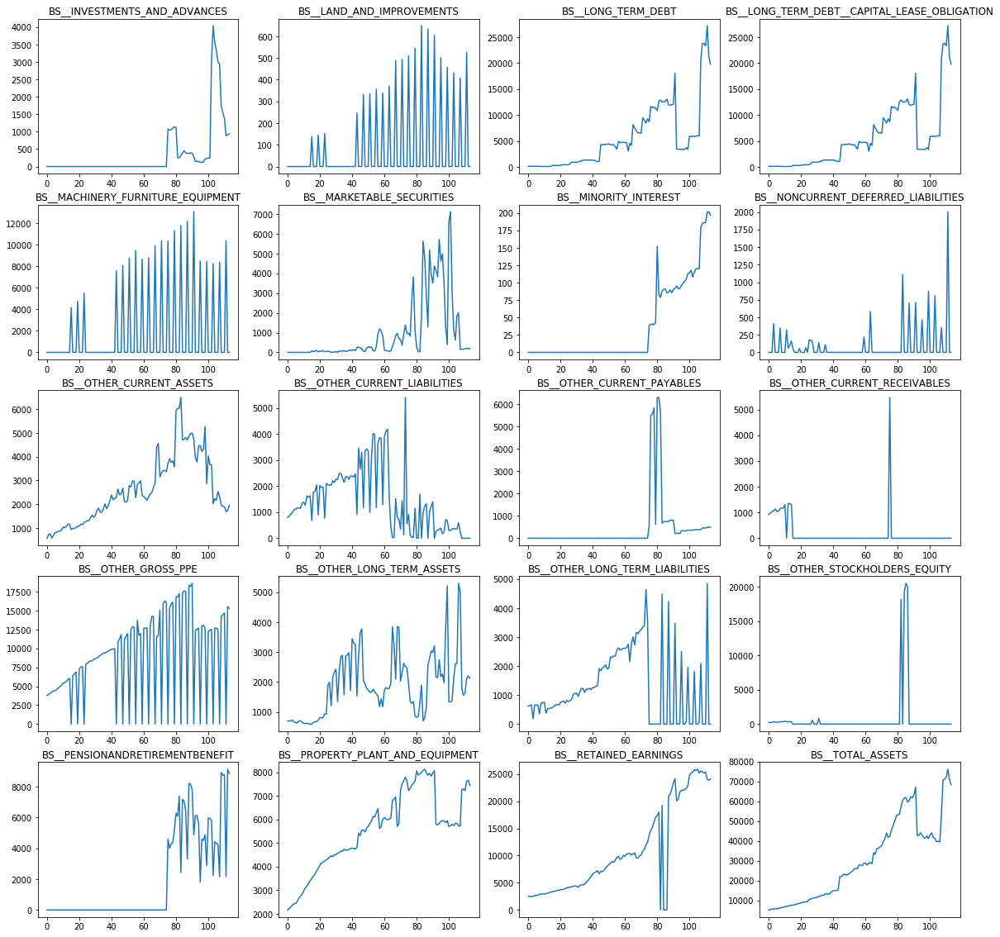

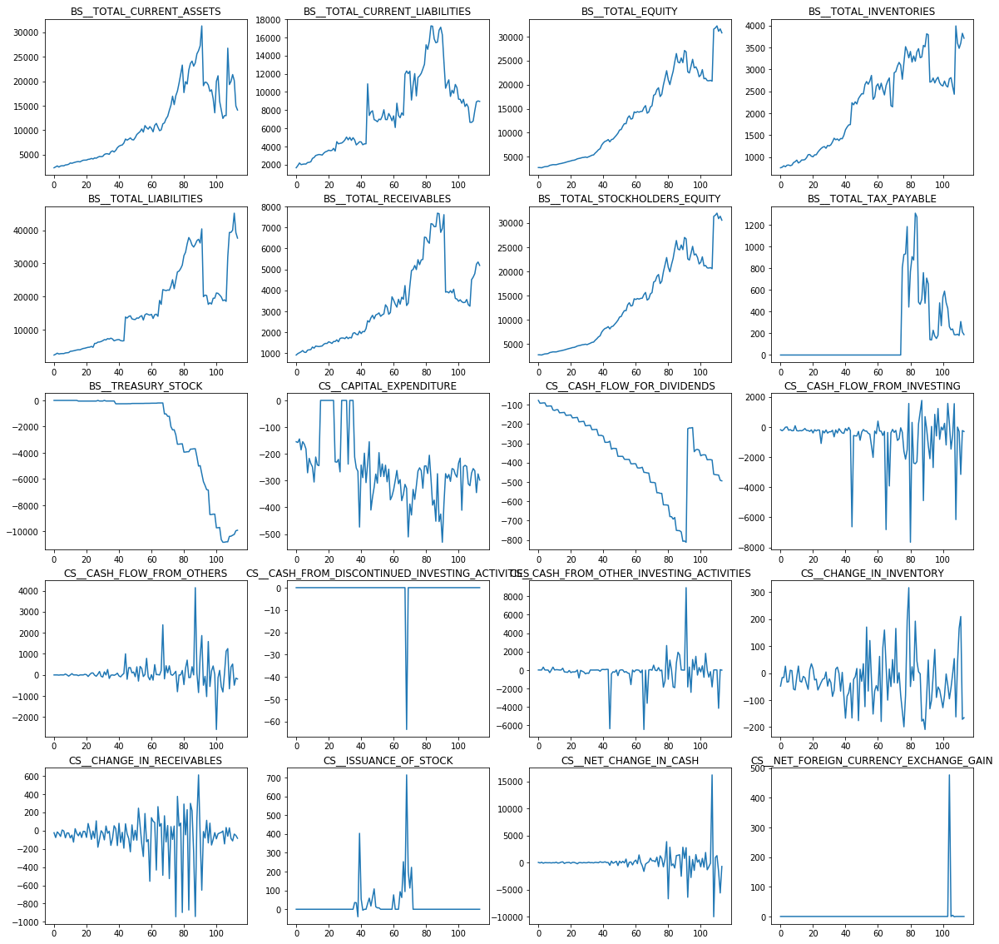

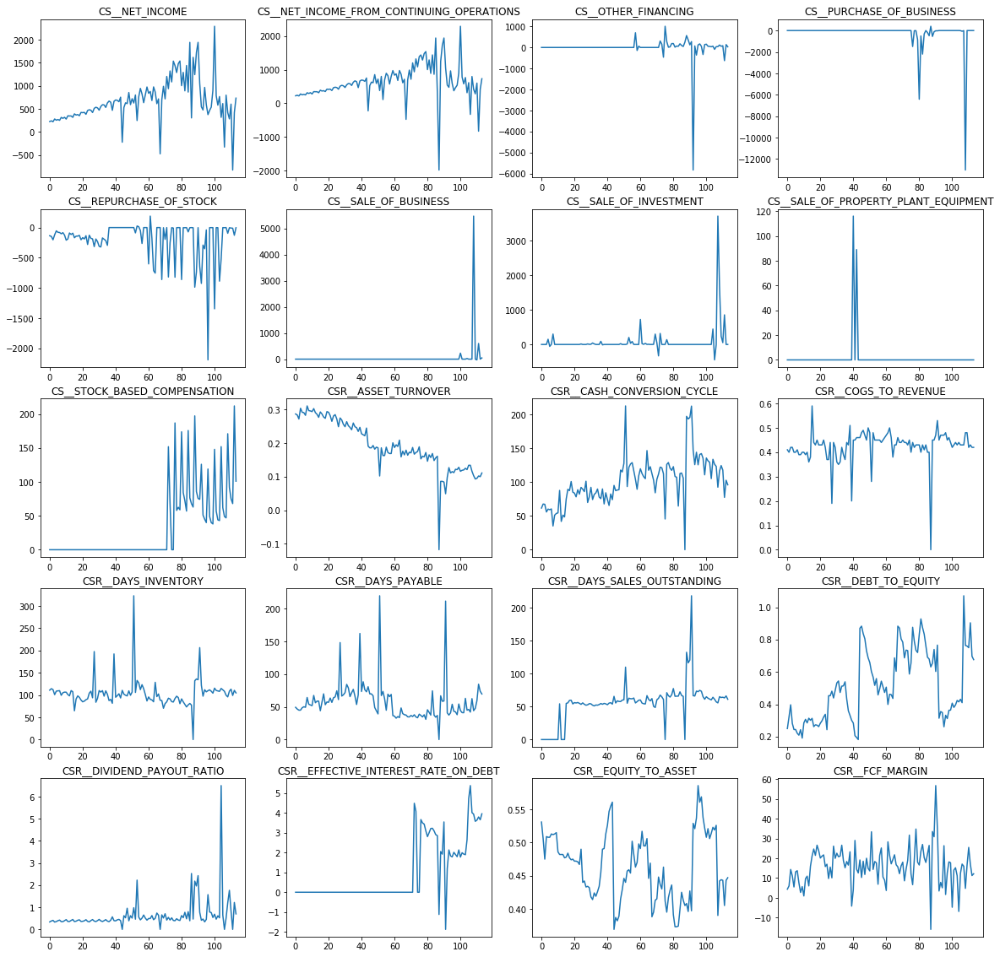

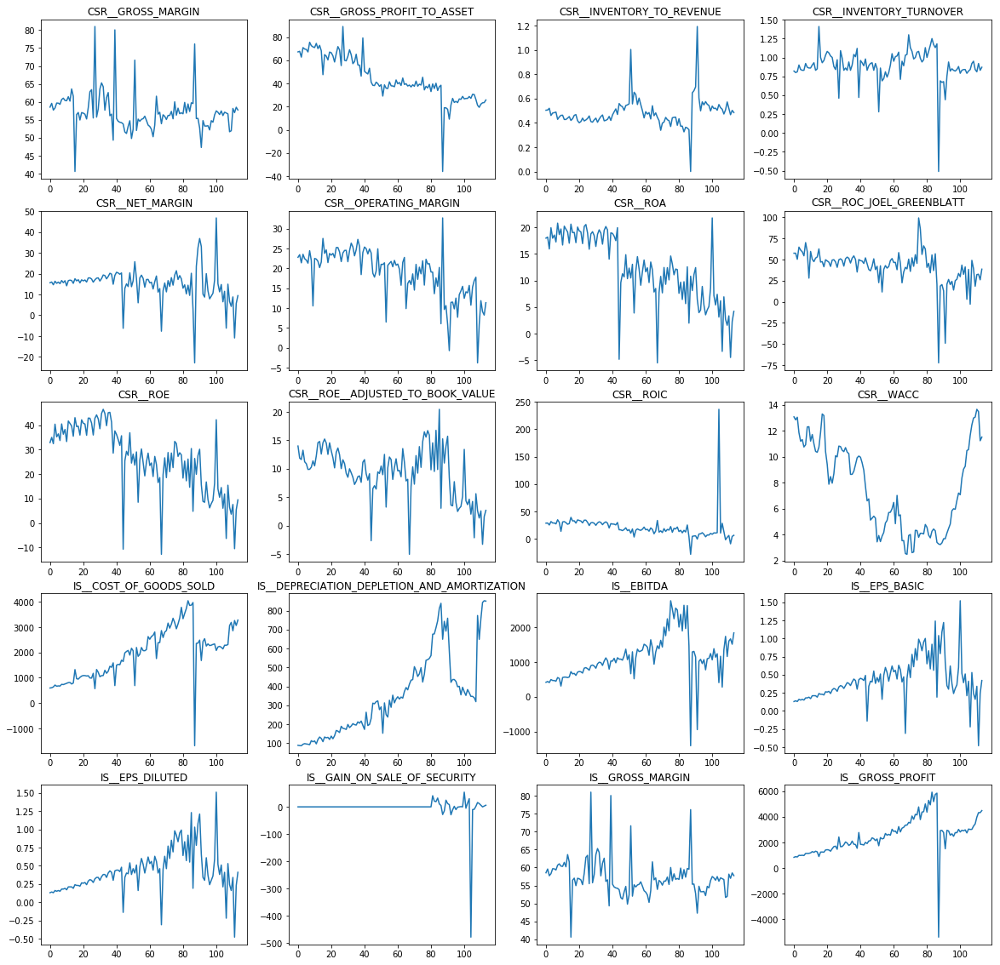

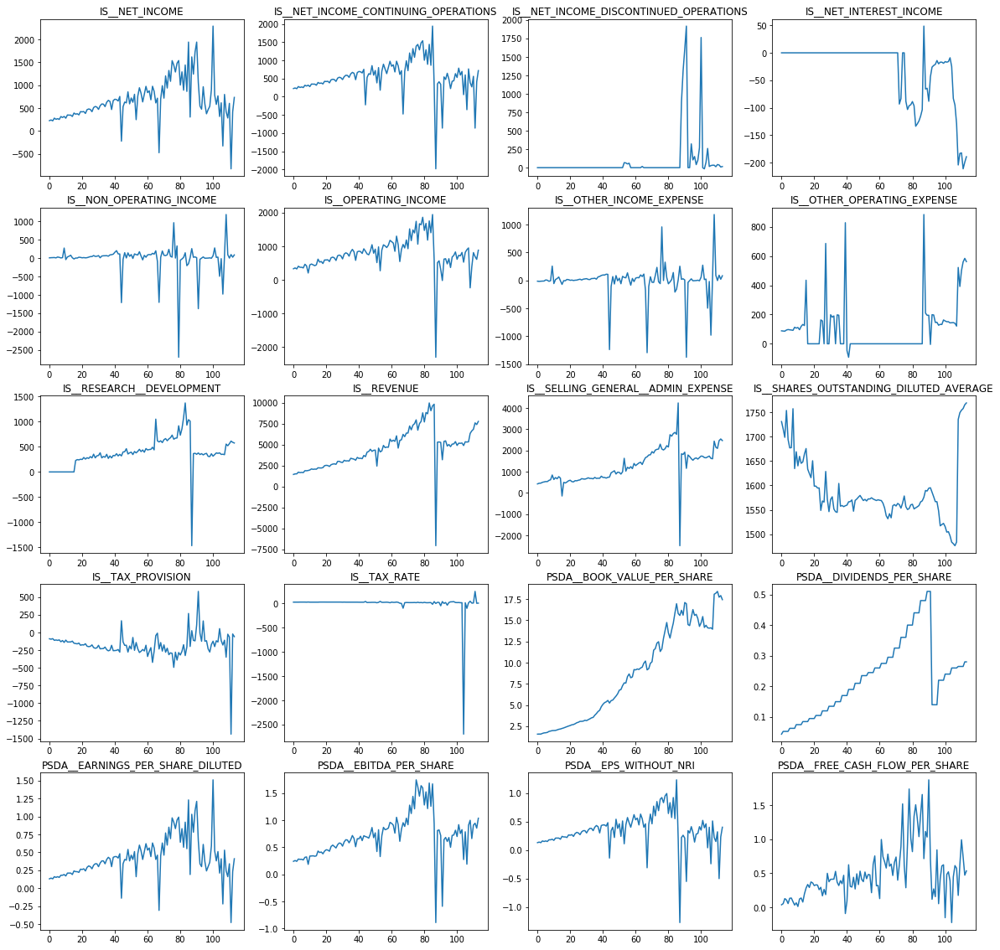

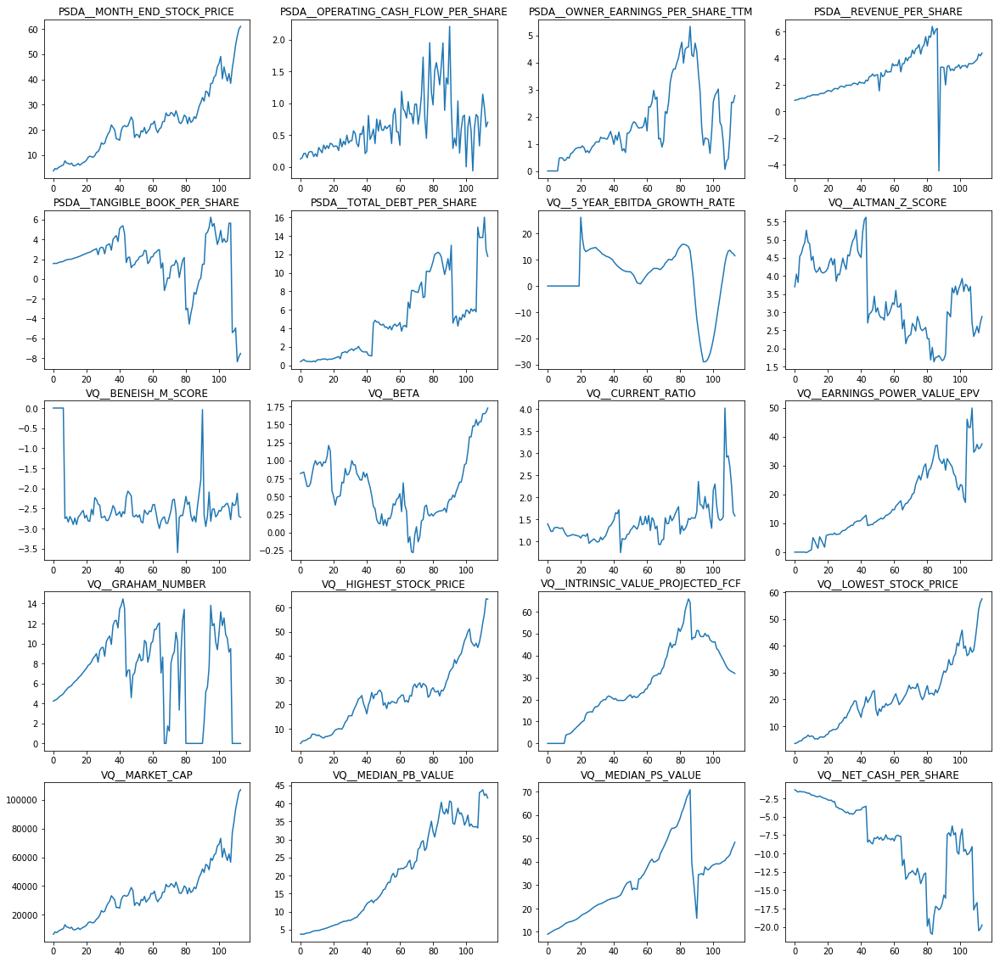

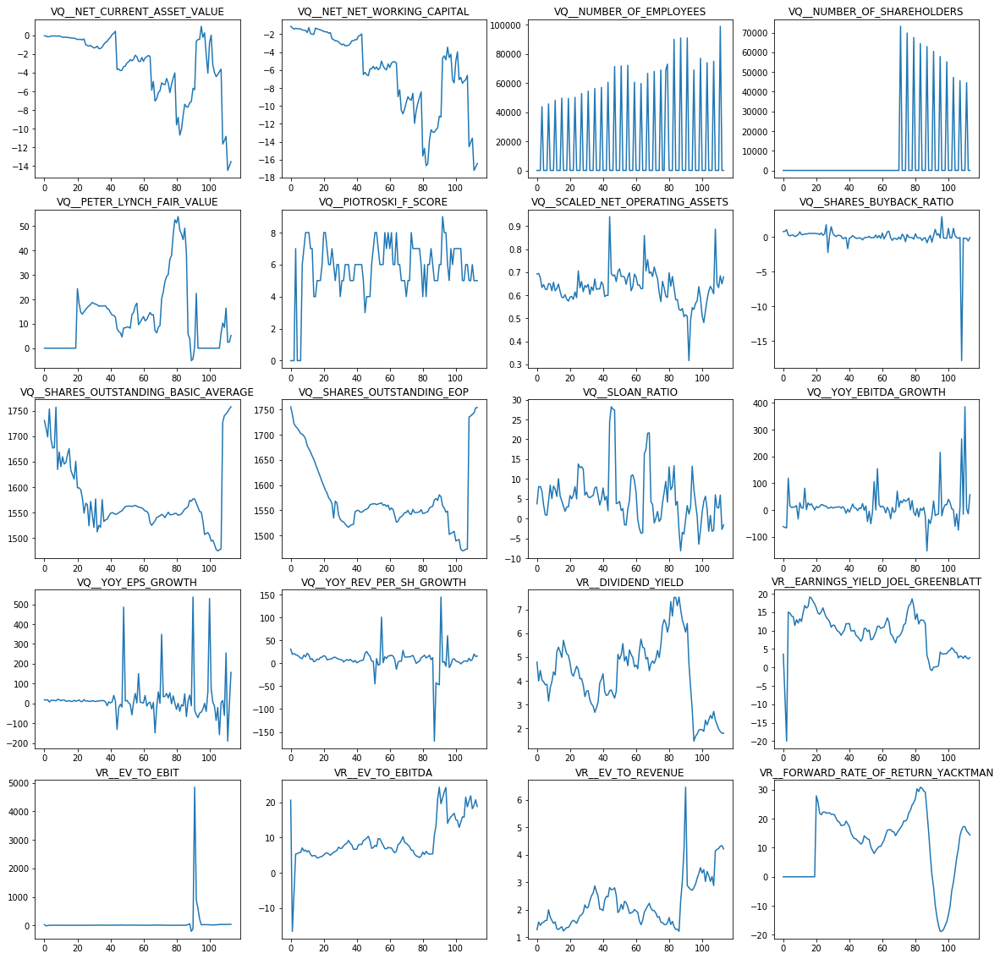

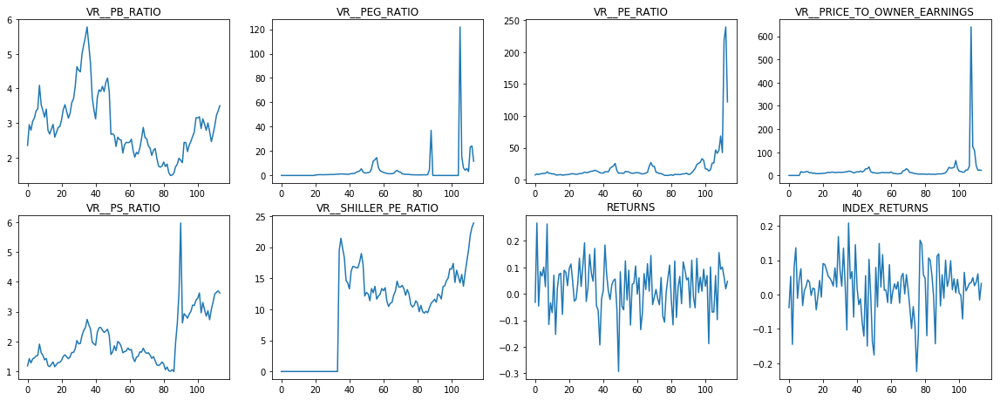

In [38]:
plt.clf()
i = 1
plt.figure(figsize=(20,20))
cols = dfAbt.columns.drop(['Year','Month'])
for col in cols:    
    plt.subplot(5, 4, i)
    plt.plot(dfAbt[col].values)
    plt.title(col)    
    if i == 20:
        i=0
        plt.show()
        plt.figure(figsize=(20,20))
    i += 1

In [39]:
dfAbt['Year'] = pd.to_numeric(dfAbt.Year)
dfAbt_validacion = dfAbt[dfAbt['Year'] == 2018]
dfAbt = dfAbt[dfAbt['Year'] < 2018]
dfAbt_validacion

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,BS__ACCOUNTS_PAYABLE,BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE,BS__ACCOUNTS_RECEIVABLE,BS__ACCUMULATED_DEPRECIATION,BS__ACCUMULATED_OTHER_COMPREHENSIVE_INCOME_LOSS,BS__ADDITIONAL_PAID_IN_CAPITAL,BS__BUILDINGS_AND_IMPROVEMENTS,BS__CASH_AND_CASH_EQUIVALENTS,BS__CASH_CASH_EQUIVALENTS_MARKETABLE_SECURITIES,BS__COMMON_STOCK,...,VR__PB_RATIO,VR__PEG_RATIO,VR__PE_RATIO,VR__PRICE_TO_OWNER_EARNINGS,VR__PS_RATIO,VR__SHILLER_PE_RATIO,RETURNS,INDEX_RETURNS,Year,Month
58181,2476.0,8273.0,5356.0,-7897.0,-5733.0,23223.0,0.0,3857.0,4042.0,0.0,...,3.35,24.18,239.68,23.79,3.70,23.2,0.019221,-0.015970,2018,03
58182,2503.0,8104.0,5192.0,-7877.0,-6913.0,23317.0,0.0,3065.0,3264.0,0.0,...,3.50,11.73,121.98,21.95,3.63,23.9,0.047758,0.032247,2018,06


### Aumentando la cantidad de muestras

In [40]:
pricesAbt = quandl.get("WIKI/ABT", start_date="1990-01-01", end_date="2017-12-31")
pricesAbt.reset_index(inplace=True)
pricesAbt.head()

,Date,Open,High,Low,Close,Volume,Ex-Dividend,Split Ratio,Adj. Open,Adj. High,Adj. Low,Adj. Close,Adj. Volume
0,1990-01-02,68.25,69.25,68.00,69.25,1263275.0,0.00,1.0,2.000662,2.029976,1.993334,2.029976,10106200.0
1,1990-01-03,69.37,69.75,69.00,69.50,764300.0,0.00,1.0,2.033493,2.044633,2.022647,2.037304,6114400.0
2,1990-01-04,69.63,69.75,68.75,69.37,809525.0,0.00,1.0,2.041115,2.044633,2.015319,2.033493,6476200.0
3,1990-01-05,69.12,69.25,68.38,68.63,422800.0,0.00,1.0,2.026165,2.029976,2.004473,2.011801,3382400.0
4,1990-01-08,68.00,68.75,67.75,68.63,828913.0,0.35,1.0,2.003499,2.025597,1.996133,2.022061,6631304.0


In [41]:
pricesAbt['Month'] = pricesAbt['Date'].dt.month
pricesAbt['Year'] = pricesAbt['Date'].dt.year
pricesAbt = pricesAbt.groupby(['Year','Month']).agg({'Open':'first', 'High':'max', 'Low':'min', 'Close':'last'})
pricesAbt['RETURNS'] = (pricesAbt['Close'] - pricesAbt['Open']) / pricesAbt['Open']
pricesAbt.head()

Open   High    Low  Close   RETURNS
Year Month                                      
1990 1      68.25  69.75  63.50  65.00 -0.047619
     2      65.00  66.25  62.50  64.12 -0.013538
     3      64.00  66.00  62.75  65.75  0.027344
     4      65.50  69.75  65.25  66.75  0.019084
     5      67.00  74.87  66.75  74.87  0.117463

In [42]:
pricesAbt.reset_index(inplace=True)
dfAbt['Month'] = pd.to_numeric(dfAbt.Month)
dfAbt = pricesAbt.set_index(['Year','Month']).join(dfAbt.set_index(['Year','Month']), lsuffix='_prices', rsuffix='_fin')
dfAbt = dfAbt.interpolate(method='linear')
dfAbt = dfAbt.dropna()
dfAbt.head()

Open   High    Low  Close  RETURNS_prices  BS__ACCOUNTS_PAYABLE  \
Year Month                                                                    
1990 3      64.0  66.00  62.75  65.75        0.027344            322.000000   
     4      65.5  69.75  65.25  66.75        0.019084            318.100000   
     5      67.0  74.87  66.75  74.87        0.117463            314.200000   
     6      38.0  42.13  37.00  41.00        0.078947            310.300000   
     7      41.0  45.63  40.50  43.50        0.060976            311.333333   

            BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE  BS__ACCOUNTS_RECEIVABLE  \
Year Month                                                                   
1990 3                                 322.000000                      0.0   
     4                                 318.100000                      0.0   
     5                                 314.200000                      0.0   
     6                                 310.300000                      0.0   
     7                                 311.333333                      0.0   

            BS__ACCUMULATED_DEPRECIATION  \
Year Month                                 
1990 3                      -1632.100000   
     4                      -1653.700000   
     5                      -1675.300000   
     6                      -1696.900000   
     7                      -1731.966667   

            BS__ACCUMULATED_OTHER_COMPREHENSIVE_INCOME_LOSS      ...        \
Year Month                                                       ...         
1990 3                                                  0.0      ...         
     4                                                  0.0      ...         
     5                                                  0.0      ...         
     6                                                  0.0      ...         
     7                                                  0.0      ...         

            VR__EV_TO_REVENUE  VR__FORWARD_RATE_OF_RETURN_YACKTMAN  \
Year Month                                                           
1990 3               1.280000                                  0.0   
     4               1.373333                                  0.0   
     5               1.466667                                  0.0   
     6               1.560000                                  0.0   
     7               1.520000                                  0.0   

            VR__PB_RATIO  VR__PEG_RATIO  VR__PE_RATIO  \
Year Month                                              
1990 3          2.350000            0.0      7.220000   
     4          2.550000            0.0      7.730000   
     5          2.750000            0.0      8.240000   
     6          2.950000            0.0      8.750000   
     7          2.896667            0.0      8.486667   

            VR__PRICE_TO_OWNER_EARNINGS  VR__PS_RATIO  VR__SHILLER_PE_RATIO  \
Year Month                                                                    
1990 3                              0.0      1.180000                   0.0   
     4                              0.0      1.260000                   0.0   
     5                              0.0      1.340000                   0.0   
     6                              0.0      1.420000                   0.0   
     7                              0.0      1.373333                   0.0   

            RETURNS_fin  INDEX_RETURNS  
Year Month                              
1990 3        -0.031579      -0.038087  
     4         0.068201      -0.007663  
     5         0.167980       0.022762  
     6         0.267760       0.053186  
     7         0.163256      -0.012929  

[5 rows x 173 columns]

In [43]:
#Predigo solo el último valor, es decir, para el 2017 devuelvo lo mismo que obtuve en 2016
#El rmse será el error producido entre el valor real de 2017 y el que se devolvió (valor a 2016)
#Esto me va a servir para comparar este modelo con el resto
persistence_model = list()
#for code, group in seriePorSimbolo:    
test_y,predictions,rmse = create_model(group, 1)                                                     
#persistence_model.append({'code': code, 'prediction':predictions, 'rmse': rmse})

In [45]:
dfAbt.reset_index(inplace=True)
dfAbt['Year'] = dfAbt['Year'].apply(lambda x: str(x))
dfAbt['Month'] = dfAbt['Month'].apply(lambda x: str(x).zfill(2))
dfAbt['Date'] = (dfAbt['Year']) + str('-') + (dfAbt['Month'])
dfAbt['Date'] = pd.to_datetime(dfAbt['Date'])
dfAbt.set_index('Date', inplace=True)
dfAbt.head()

,Year,Month,Open,High,Low,Close,RETURNS_prices,BS__ACCOUNTS_PAYABLE,BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE,BS__ACCOUNTS_RECEIVABLE,...,VR__EV_TO_REVENUE,VR__FORWARD_RATE_OF_RETURN_YACKTMAN,VR__PB_RATIO,VR__PEG_RATIO,VR__PE_RATIO,VR__PRICE_TO_OWNER_EARNINGS,VR__PS_RATIO,VR__SHILLER_PE_RATIO,RETURNS_fin,INDEX_RETURNS
Date,,,,,,,,,,,,,,,,,,,,,
1990-03-01,1990,03,64.0,66.00,62.75,65.75,0.027344,322.000000,322.000000,0.0,...,1.280000,0.0,2.350000,0.0,7.220000,0.0,1.180000,0.0,-0.031579,-0.038087
1990-04-01,1990,04,65.5,69.75,65.25,66.75,0.019084,318.100000,318.100000,0.0,...,1.373333,0.0,2.550000,0.0,7.730000,0.0,1.260000,0.0,0.068201,-0.007663
1990-05-01,1990,05,67.0,74.87,66.75,74.87,0.117463,314.200000,314.200000,0.0,...,1.466667,0.0,2.750000,0.0,8.240000,0.0,1.340000,0.0,0.167980,0.022762
1990-06-01,1990,06,38.0,42.13,37.00,41.00,0.078947,310.300000,310.300000,0.0,...,1.560000,0.0,2.950000,0.0,8.750000,0.0,1.420000,0.0,0.267760,0.053186
1990-07-01,1990,07,41.0,45.63,40.50,43.50,0.060976,311.333333,311.333333,0.0,...,1.520000,0.0,2.896667,0.0,8.486667,0.0,1.373333,0.0,0.163256,-0.012929


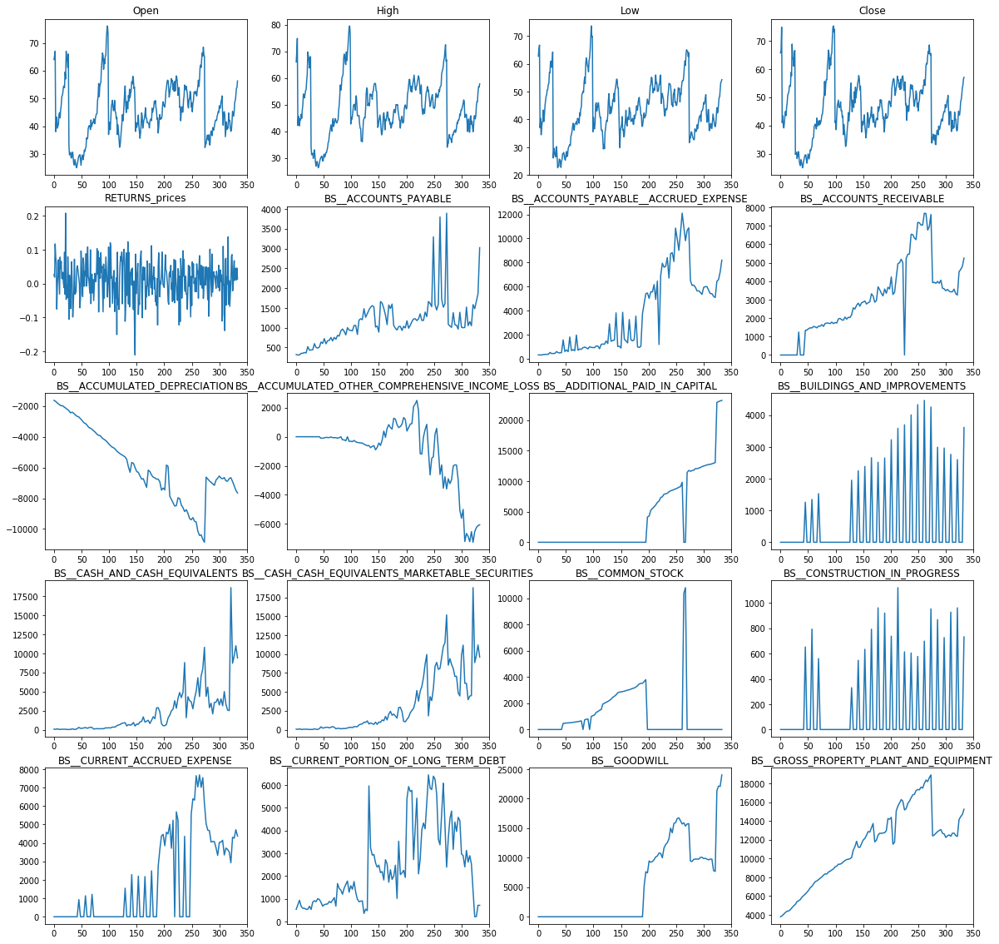

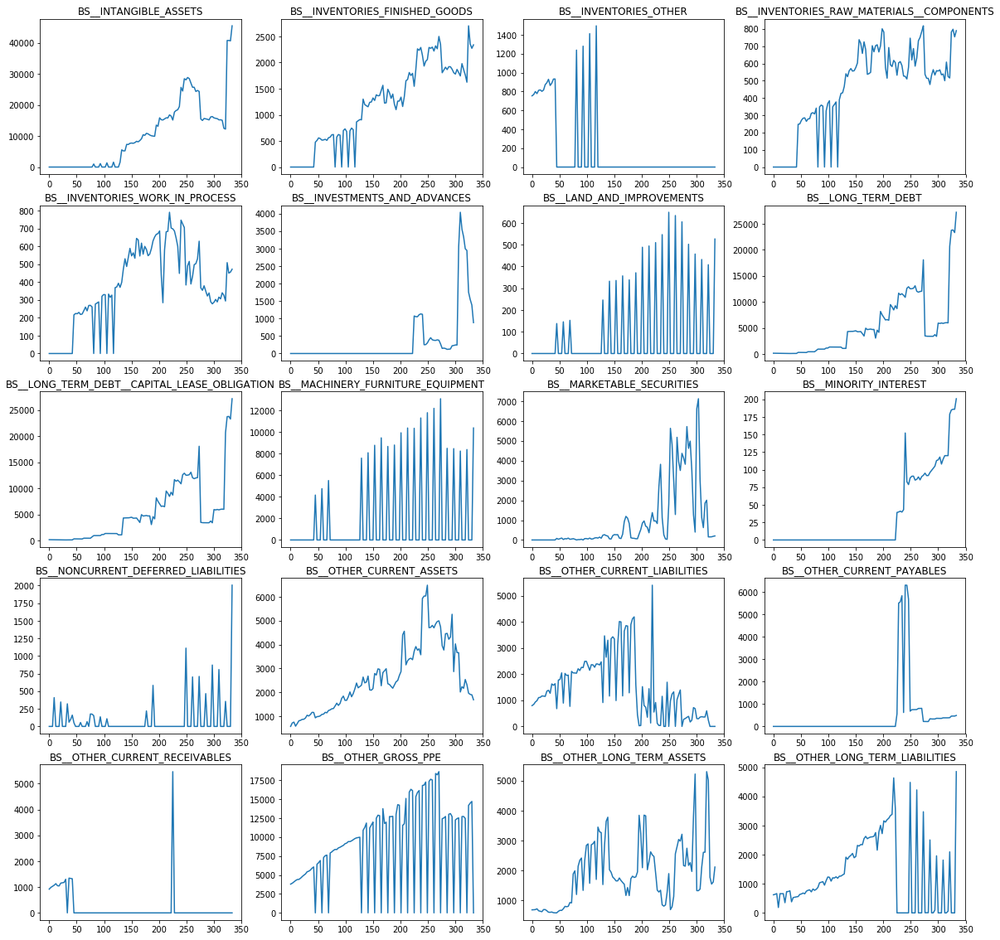

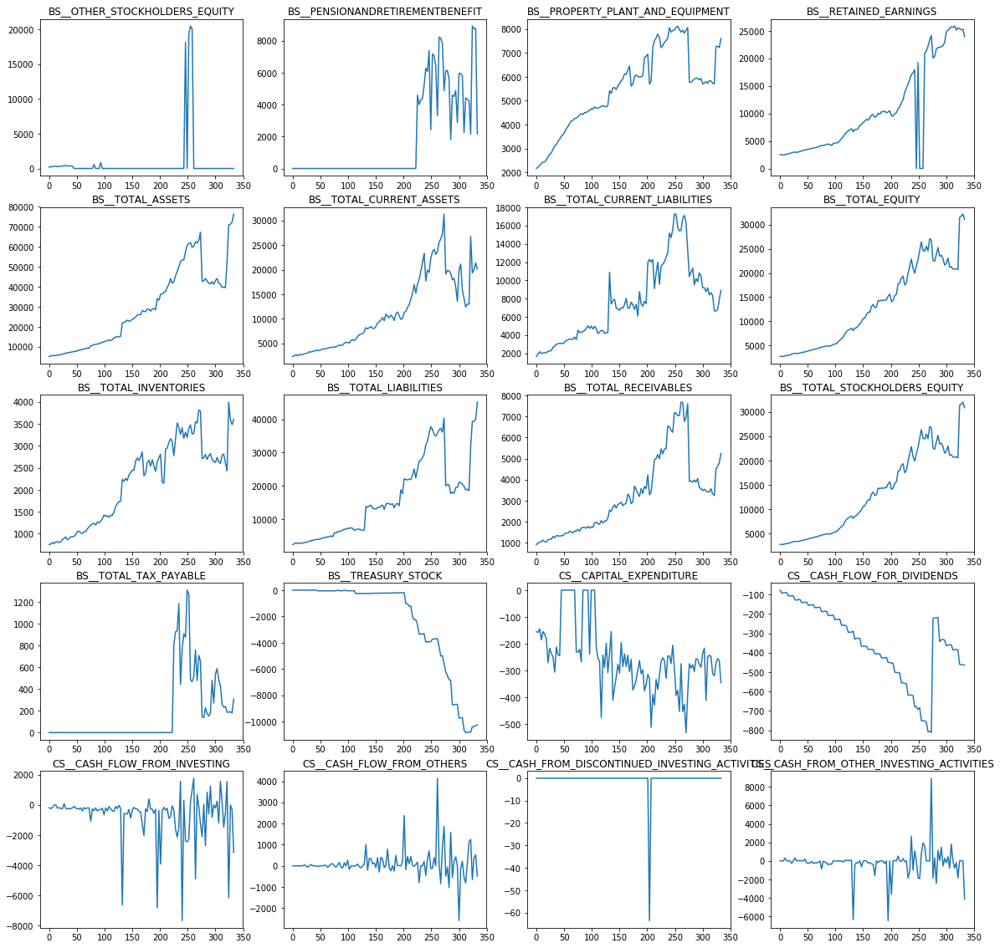

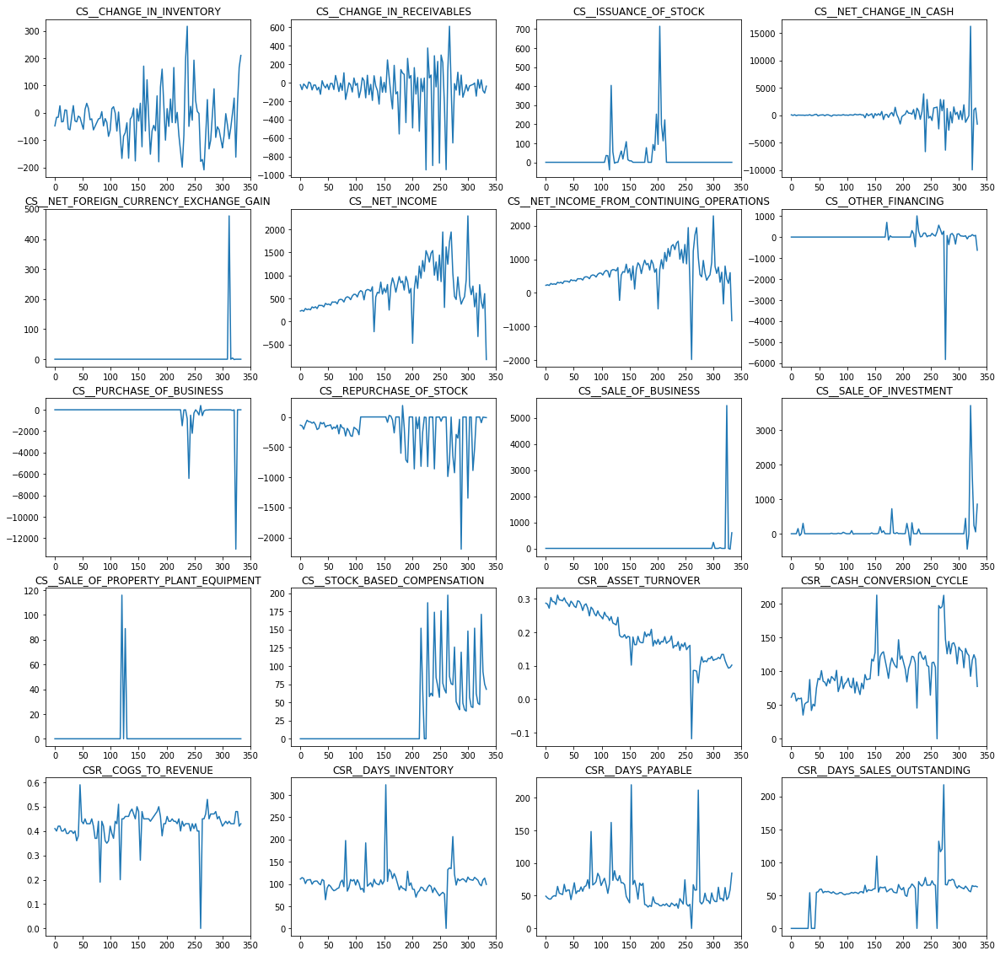

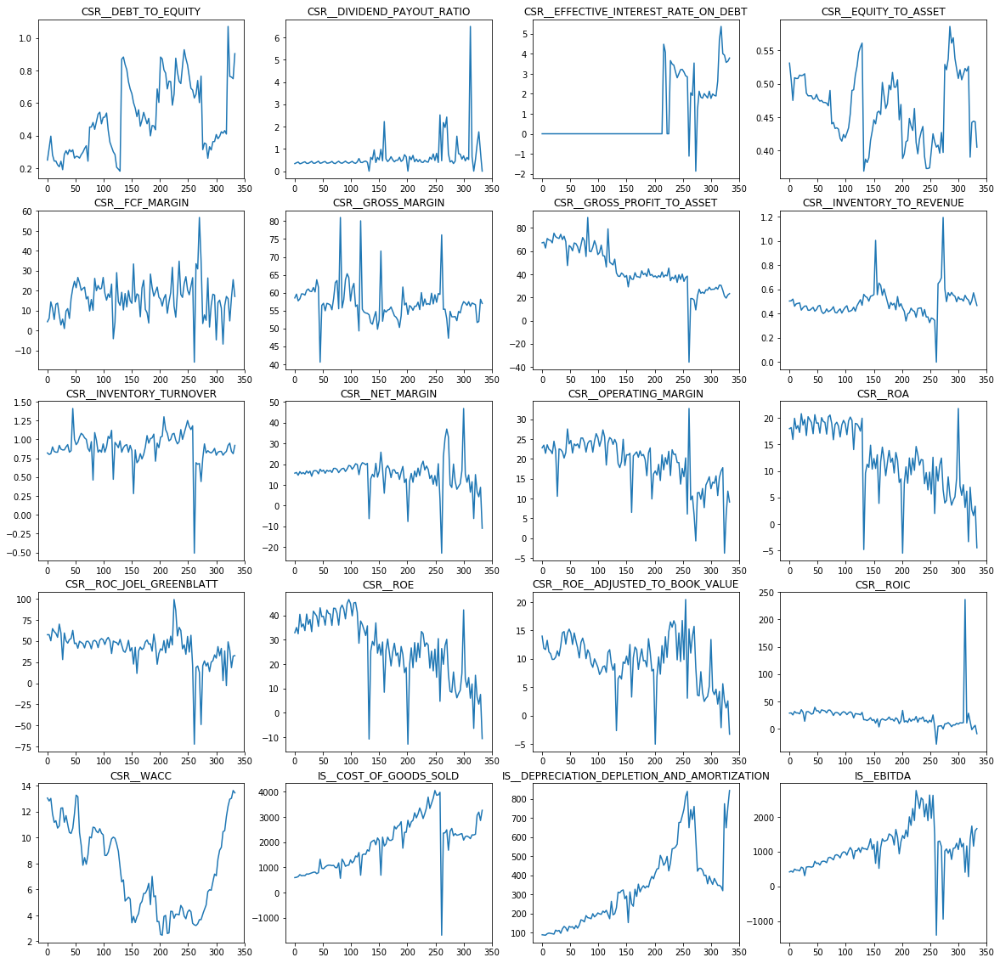

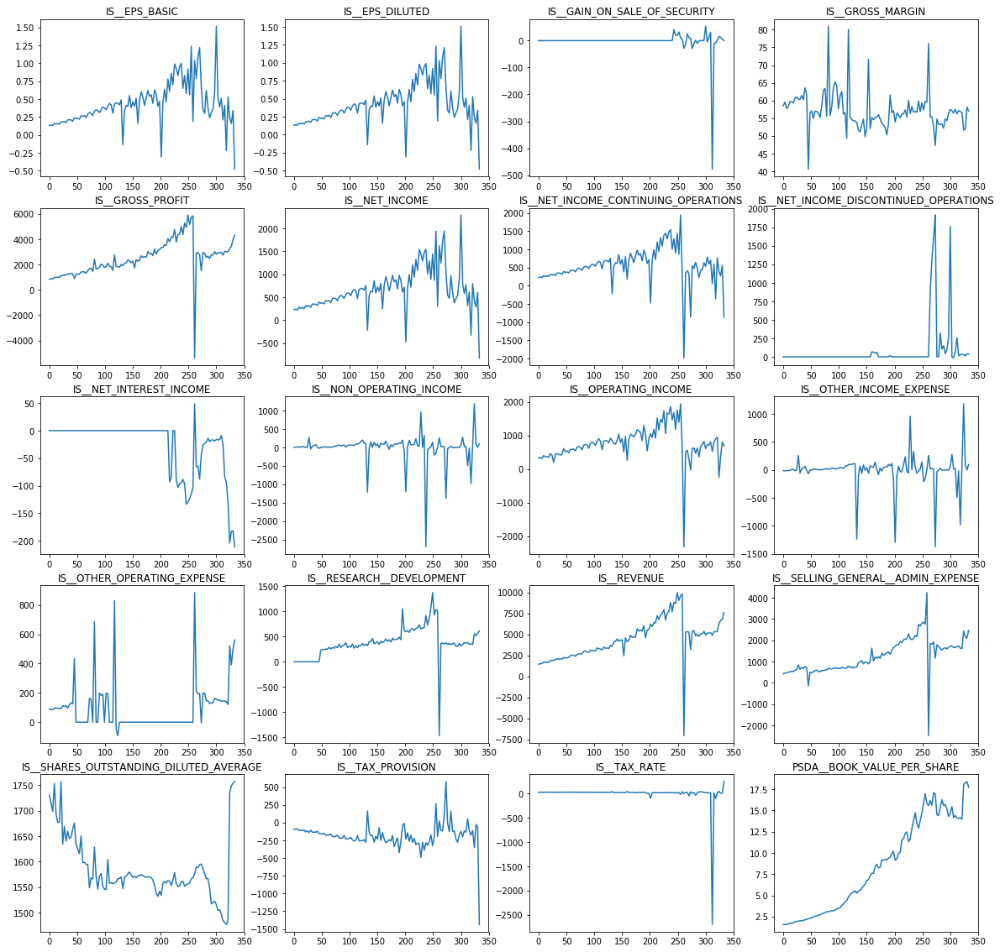

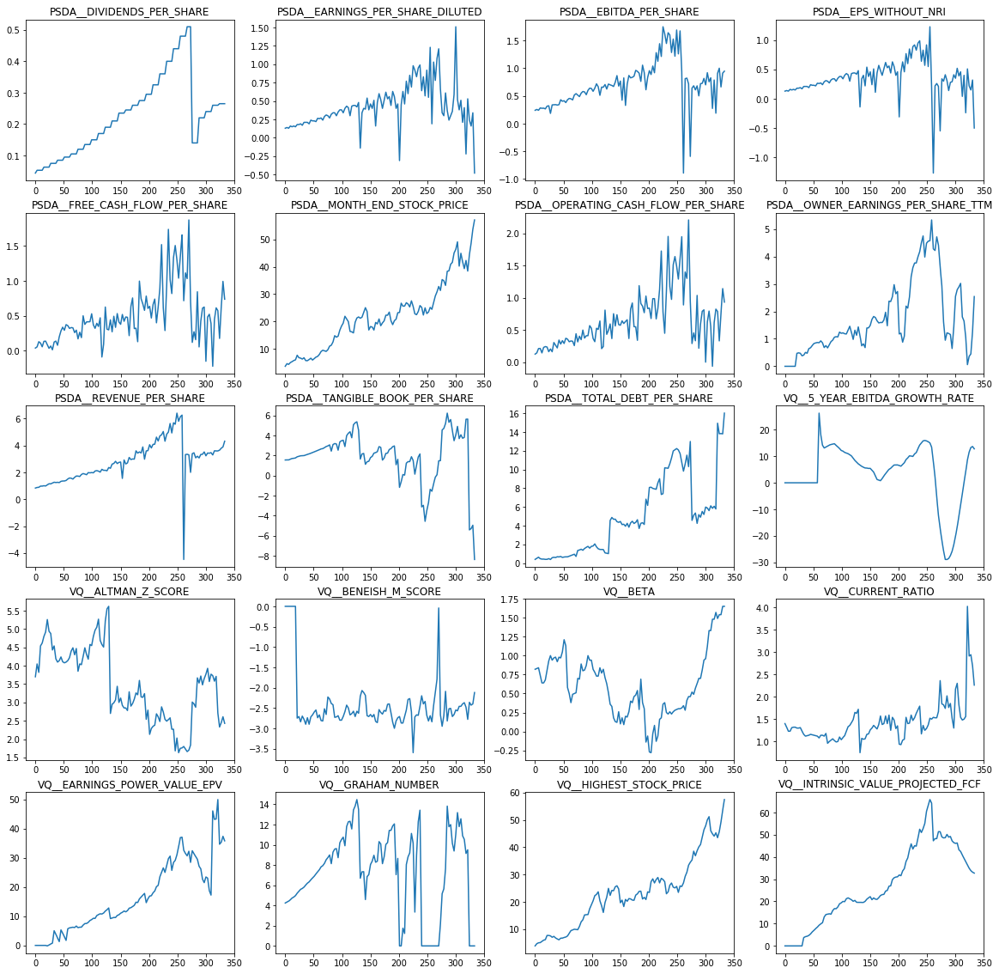

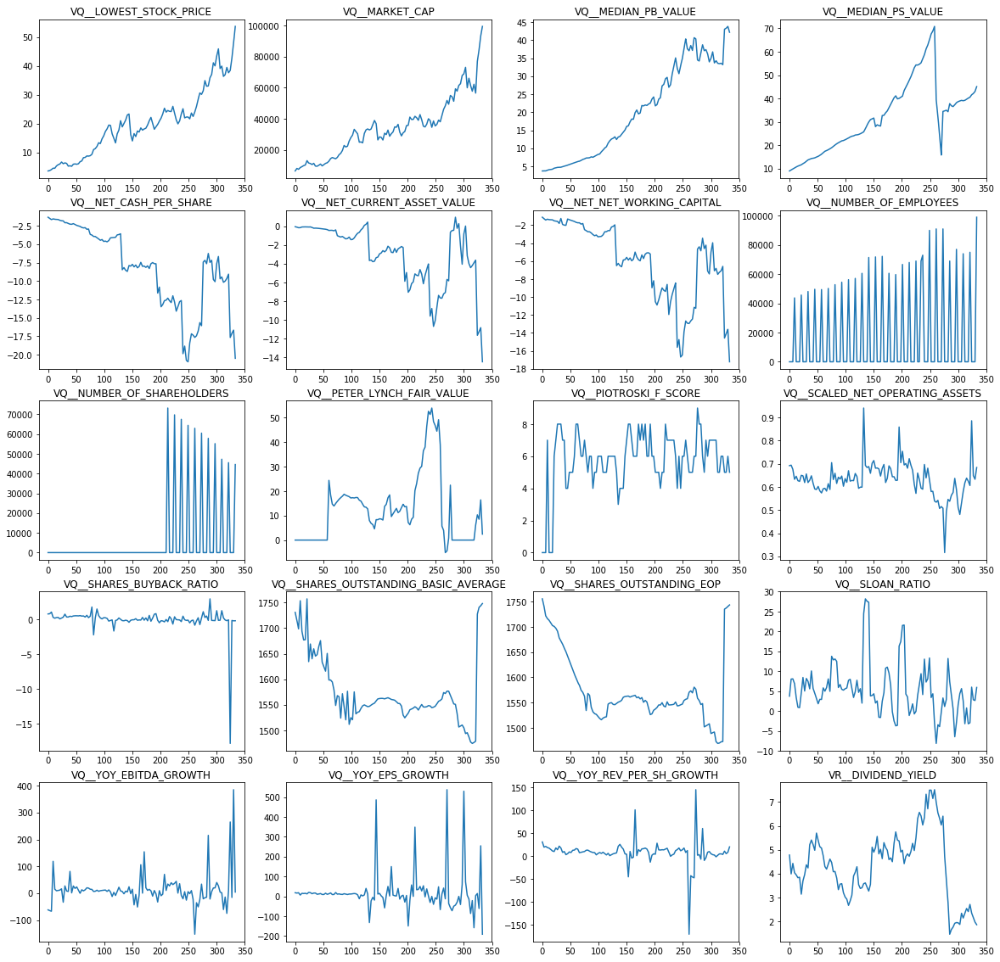

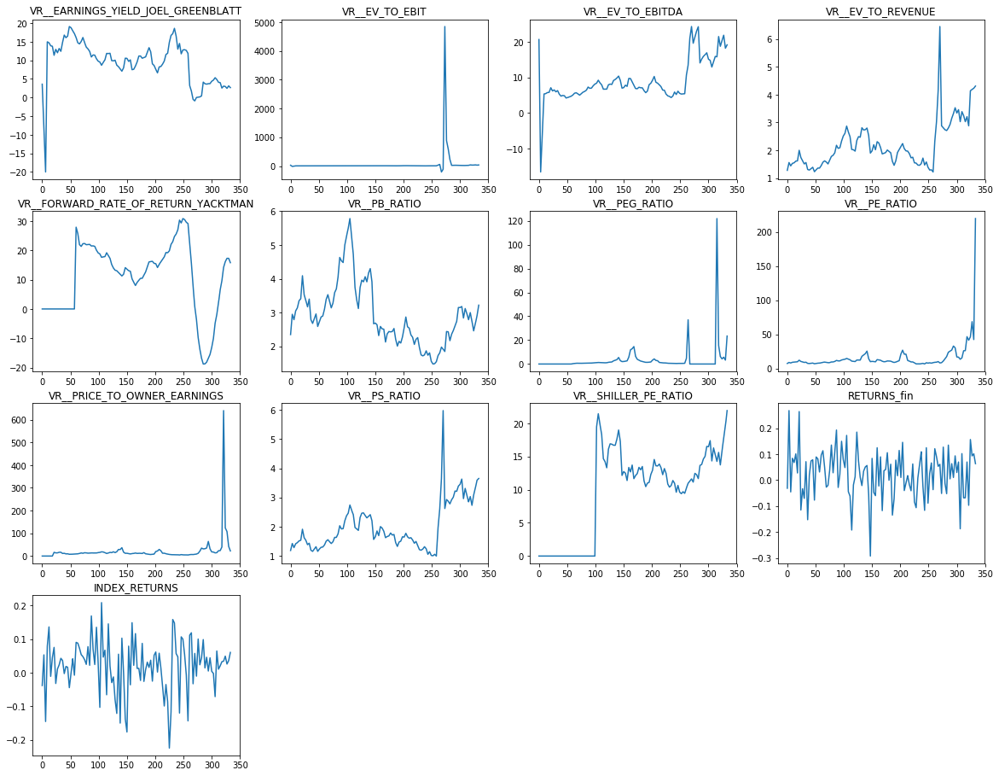

In [47]:
dfAbt.drop(['Year','Month'], axis=1, inplace=True)
plt.clf()
i = 1
plt.figure(figsize=(20,20))
cols = dfAbt.columns
for col in cols:    
    plt.subplot(5, 4, i)
    plt.plot(dfAbt[col].values)
    plt.title(col)    
    if i == 20:
        i=0
        plt.show()
        plt.figure(figsize=(20,20))
    i += 1

In [48]:
columnas_seleccionadas = ['CSR__ROC_JOEL_GREENBLATT','VQ__PIOTROSKI_F_SCORE',
                          'PSDA__EARNINGS_PER_SHARE_DILUTED',
                          'PSDA__EBITDA_PER_SHARE','PSDA__TOTAL_DEBT_PER_SHARE','CSR__NET_MARGIN',
                          'IS__REVENUE','IS__NET_INCOME','IS__COST_OF_GOODS_SOLD','BS__TOTAL_EQUITY','IS__EBITDA',
                          'BS__TOTAL_ASSETS','BS__LONG_TERM_DEBT','BS__TOTAL_CURRENT_LIABILITIES','RETURN_fin']
dfAbt = dfAbt.loc[:,columnas_seleccionadas]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1367: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


In [49]:
from statsmodels.tsa.vector_ar.var_model import VAR

#creating the train and validation set
train = dfAbt[:int(0.8*(len(dfAbt)))]
valid = dfAbt[int(0.8*(len(dfAbt))):]

#fit the model
model = VAR(endog=train)
model_fit = model.fit()

# make prediction on validation    
p = model_fit.forecast(model_fit.y, steps=len(valid))
#predictions.append({'codigo':c, 'prediction':p, 'valid': valid})

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:52: RuntimeWarning: invalid value encountered in reduce
  return getattr(obj, method)(*args, **kwds)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\vector_ar\var_model.py:461: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  params = np.linalg.lstsq(z, y_sample)[0]


In [50]:
p

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

De nuevo no hemos podido predecir nada

### Métodos ML

In [60]:
financialDF = pd.read_csv('Datos/financials_prices_quaterly_guru_rango_fechas_v2.csv', sep=',', index_col=[0], header=0)
financialDF['Year'] = financialDF['FISCAL_YEAR'].str.split('-').str[0]
financialDF['Month'] = financialDF['FISCAL_YEAR'].str.split('-').str[1]
num_valores = round(financialDF.shape[0]*0.90)
financialDF.dropna(thresh=num_valores, axis=1, inplace=True)
financialDF.head()

,FISCAL_YEAR,BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE,BS__ACCOUNTS_RECEIVABLE,BS__ACCUMULATED_OTHER_COMPREHENSIVE_INCOME_LOSS,BS__ADDITIONAL_PAID_IN_CAPITAL,BS__CASH_AND_CASH_EQUIVALENTS,BS__COMMON_STOCK,BS__CURRENT_PORTION_OF_LONG_TERM_DEBT,BS__DEBT_TO_EQUITY,BS__EQUITY_TO_ASSET,...,PRICE_FIN,INDEX_RETURNS,RETURNS_NEXT,INDEX_RETURNS_NEXT,RETURNS_CAT,RETURNS_NEXT_CAT,RETURNS_vs_INDEX,RETURNS_vs_INDEX_NEXT,Year,Month
Ticker,,,,,,,,,,,,,,,,,,,,,
SVMK,2016-12,27.813000,6.104,0.087,185.490,23.287000,1.00500,1.180,12.151,0.000,...,0.0,0.034422,0.0,0.025851,NEGATIVE,NEGATIVE,LOSES,LOSES,2016,12
SVMK,2017-06,0.000000,0.000,0.000,0.000,0.000000,0.00000,0.000,NaN,0.000,...,0.0,0.025851,0.0,0.060451,NEGATIVE,NEGATIVE,LOSES,LOSES,2017,06
SVMK,2017-12,13.553000,5.429,0.019,216.581,35.345000,1.01400,2.032,10.282,0.069,...,0.0,0.060451,0.0,0.032247,NEGATIVE,NEGATIVE,LOSES,LOSES,2017,12
SVMK,2018-06,16.778000,6.243,-0.243,231.586,43.391000,1.01700,2.032,14.850,0.048,...,0.0,0.032247,NaN,NaN,NEGATIVE,NEGATIVE,LOSES,LOSES,2018,06
SVNLF,2005-12,96.456148,0.000,0.000,0.000,882.064438,362.05639,0.000,8.108,0.000,...,0.0,0.015853,0.0,0.061745,NEGATIVE,NEGATIVE,LOSES,LOSES,2005,12


In [61]:
columns_to_drop = ['FISCAL_YEAR', 'PRICE_INI', 'PRICE_FIN', 'INDEX_RETURNS_NEXT', 'RETURNS_CAT', 
                   'RETURNS_NEXT_CAT', 'RETURNS_vs_INDEX', 'RETURNS_vs_INDEX_NEXT', 'REGION', 'PRELIMINARY',
                   'BS__DEBT_TO_EQUITY','BS__EQUITY_TO_ASSET','IS__NET_MARGIN','IS__OPERATING_MARGIN',
                   'CS__DEPRECIATION_DEPLETION_AND_AMORTIZATION','VQ__MONTH_END_STOCK_PRICE',
                   'VQ__ENTERPRISE_VALUE','VQ__QUICK_RATIO','CS__CASH_FLOW_FROM_OPERATIONS',
                   'VR__PRICE_TO_FREE_CASH_FLOW','CS__PURCHASE_OF_PROPERTY_PLANT_EQUIPMENT',
                   'CS__CASH_FLOW_FROM_OPERATIONS','CS__CHANGE_IN_WORKING_CAPITAL','CS__CASH_FLOW_FROM_FINANCING',
                   'CS__NET_ISSUANCE_OF_DEBT','CS__FREE_CASH_FLOW','CS__CHANGE_IN_WORKING_CAPITAL',
                   'CS__CASH_FLOW_FROM_OPERATIONS','CS__CASH_FLOW_FROM_FINANCING','CS__FREE_CASH_FLOW',
                   'PSDA__EBIT_PER_SHARE','IS__INTEREST_EXPENSE','CS__CASH_FLOW_FROM_OPERATIONS',
                   'VR__PRICE_TO_OPERATING_CASH_FLOW','VR__PRICE_TO_FREE_CASH_FLOW','VR__PRICE_TO_TANGIBLE_BOOK',
                   'BS__PREFERRED_STOCK','IS__PRE_TAX_INCOME','BS__EQUITY_TO_ASSET','CSR__DEBT_TO_ASSET',
                   'CS__CASH_FLOW_FROM_FINANCING','CS__CASH_FLOW_FROM_FINANCING','CS__CASH_FLOW_FROM_FINANCING',
                   'CS__NET_ISSUANCE_OF_DEBT','CS__CASH_FLOW_FROM_FINANCING','CS__PURCHASE_OF_INVESTMENT',
                   'CS__CASH_FLOW_FROM_FINANCING','IS__INTEREST_INCOME','CS__CASH_FLOW_FROM_OPERATIONS',
                   'CS__FREE_CASH_FLOW','CS__CASH_FLOW_FROM_OPERATIONS','CS__NET_ISSUANCE_OF_DEBT',
                   'IS__INTEREST_EXPENSE']
financialDF.drop(columns_to_drop, axis=1, inplace=True)
financialDF.shape    

(385772, 137)

In [63]:
columns_to_drop = []
cols = financialDF.columns.drop(['Year', 'Month'])
for c in cols:    
    if financialDF[c].sum() == 0:         
        columns_to_drop.append(c)
financialDF.drop(columns_to_drop, axis=1, inplace=True)
financialDF.shape 

(385772, 137)

In [64]:
dfApple = financialDF.loc[('AAPL'),]
dfApple['Year'] = pd.to_numeric(dfApple.Year)
dfApple_validacion = dfApple[dfApple['Year'] == 2018]
dfApple = dfApple[dfApple['Year'] < 2018]
dfApple_validacion

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE,BS__ACCOUNTS_RECEIVABLE,BS__ACCUMULATED_OTHER_COMPREHENSIVE_INCOME_LOSS,BS__ADDITIONAL_PAID_IN_CAPITAL,BS__CASH_AND_CASH_EQUIVALENTS,BS__COMMON_STOCK,BS__CURRENT_PORTION_OF_LONG_TERM_DEBT,BS__GOODWILL,BS__INTANGIBLE_ASSETS,BS__LONG_TERM_DEBT__CAPITAL_LEASE_OBLIGATION,...,VR__FORWARD_RATE_OF_RETURN_YACKTMAN,VR__PB_RATIO,VR__PE_RATIO,VR__PS_RATIO,VR__SHILLER_PE_RATIO,RETURNS,INDEX_RETURNS,RETURNS_NEXT,Year,Month
Ticker,,,,,,,,,,,,,,,,,,,,,
AAPL,61067.0,14324.0,-3064.0,0.0,45059.0,38044.0,20478.0,0.0,0.0,101362.0,...,19.08,6.54,16.19,3.50,26.50,-0.026007,-0.015970,0.110571,2018,03
AAPL,63673.0,14104.0,-3111.0,0.0,31971.0,38624.0,17472.0,0.0,0.0,97128.0,...,18.39,7.80,16.78,3.69,28.01,0.110571,0.032247,NaN,2018,06


In [65]:
pricesAppl = quandl.get("WIKI/AAPL", start_date="1990-01-01", end_date="2017-12-31")
pricesAppl.reset_index(inplace=True)
pricesAppl['Month'] = pricesAppl['Date'].dt.month
pricesAppl['Year'] = pricesAppl['Date'].dt.year
pricesAppl = pricesAppl.groupby(['Year','Month']).agg({'Open':'first', 'High':'max', 'Low':'min', 'Close':'last'})
pricesAppl['RETURNS'] = (pricesAppl['Close'] - pricesAppl['Open']) / pricesAppl['Open']
pricesAppl.reset_index(inplace=True)
pricesAppl.head()

,Year,Month,Open,High,Low,Close,RETURNS
0,1990,1,35.25,38.75,32.13,34.00,-0.035461
1,1990,2,34.50,35.25,32.25,34.00,-0.014493
2,1990,3,33.50,43.38,33.25,40.25,0.201493
3,1990,4,40.00,44.25,38.13,39.38,-0.015500
4,1990,5,39.75,42.75,38.75,41.25,0.037736


In [66]:
dfApple['Month'] = pd.to_numeric(dfApple.Month)
dfApple = pricesAppl.set_index(['Year','Month']).join(dfApple.set_index(['Year','Month']), lsuffix='_prices', rsuffix='_fin')
dfApple = dfApple.interpolate(method='linear')
dfApple = dfApple.dropna()
dfApple.head()

Open   High    Low  Close  RETURNS_prices  \
Year Month                                               
1990 3      33.50  43.38  33.25  40.25        0.201493   
     4      40.00  44.25  38.13  39.38       -0.015500   
     5      39.75  42.75  38.75  41.25        0.037736   
     6      41.38  44.88  37.50  44.75        0.081440   
     7      44.50  47.75  40.00  42.00       -0.056180   

            BS__ACCOUNTS_PAYABLE__ACCRUED_EXPENSE  BS__ACCOUNTS_RECEIVABLE  \
Year Month                                                                   
1990 3                                 235.800000                      0.0   
     4                                 250.233333                      0.0   
     5                                 264.666667                      0.0   
     6                                 279.100000                      0.0   
     7                                 299.600000                      0.0   

            BS__ACCUMULATED_OTHER_COMPREHENSIVE_INCOME_LOSS  \
Year Month                                                    
1990 3                                                  0.0   
     4                                                  0.0   
     5                                                  0.0   
     6                                                  0.0   
     7                                                  0.0   

            BS__ADDITIONAL_PAID_IN_CAPITAL  BS__CASH_AND_CASH_EQUIVALENTS  \
Year Month                                                                  
1990 3                                 0.0                     645.800000   
     4                                 0.0                     652.200000   
     5                                 0.0                     658.600000   
     6                                 0.0                     665.000000   
     7                                 0.0                     568.233333   

                ...       VR__EV_TO_EBITDA  VR__EV_TO_REVENUE  \
Year Month      ...                                             
1990 3          ...              -2.790000           0.780000   
     4          ...              -2.476667           0.800000   
     5          ...              -2.163333           0.820000   
     6          ...              -1.850000           0.840000   
     7          ...              -0.100000           0.746667   

            VR__FORWARD_RATE_OF_RETURN_YACKTMAN  VR__PB_RATIO  VR__PE_RATIO  \
Year Month                                                                    
1990 3                                      0.0      3.160000     10.140000   
     4                                      0.0      3.293333     10.316667   
     5                                      0.0      3.426667     10.493333   
     6                                      0.0      3.560000     10.670000   
     7                                      0.0      3.146667      9.700000   

            VR__PS_RATIO  VR__SHILLER_PE_RATIO  RETURNS_fin  INDEX_RETURNS  \
Year Month                                                                   
1990 3          0.940000                   0.0     0.142857      -0.038087   
     4          0.966667                   0.0     0.132275      -0.007663   
     5          0.993333                   0.0     0.121693       0.022762   
     6          1.020000                   0.0     0.111111       0.053186   
     7          0.900000                   0.0    -0.038452      -0.012929   

            RETURNS_NEXT  
Year Month                
1990 3          0.111111  
     4         -0.038452  
     5         -0.188016  
     6         -0.337580  
     7         -0.087438  

[5 rows x 140 columns]

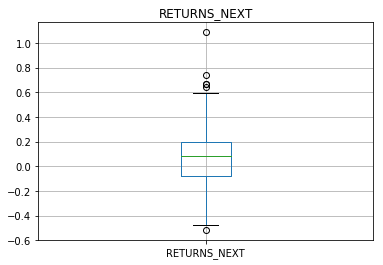

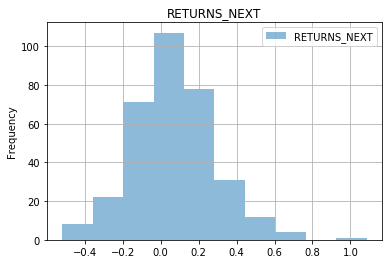

count    334.000000
mean       0.073065
std        0.218195
min       -0.517060
25%       -0.076021
50%        0.083045
75%        0.196691
max        1.085106
Name: RETURNS_NEXT, dtype: float64

In [68]:
dfApple.boxplot('RETURNS_NEXT')
plt.title('RETURNS_NEXT')
plt.show()

dfApple['RETURNS_NEXT'].plot.hist(alpha = 0.5, bins = 10, grid = True)
plt.legend()
plt.title('RETURNS_NEXT')
plt.show()

dfApple['RETURNS_NEXT'].describe()

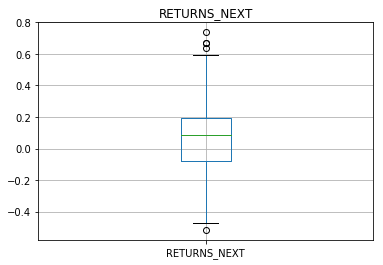

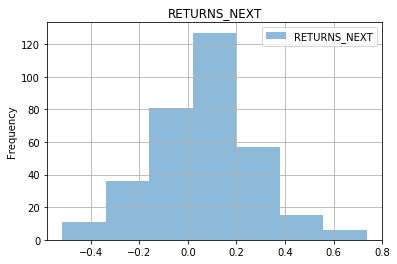

333

In [71]:
dfApple = dfApple[dfApple['RETURNS_NEXT'] < 0.9]
dfApple = dfApple[dfApple['RETURNS_NEXT'] > -0.9]

dfApple.boxplot('RETURNS_NEXT')
plt.title('RETURNS_NEXT')
plt.show()

dfApple['RETURNS_NEXT'].plot.hist(alpha = 0.5, bins = 7, grid = True)
plt.legend()
plt.title('RETURNS_NEXT')
plt.show()

dfApple['RETURNS_NEXT'].describe()

len(dfApple)